# Mnist Model Parameter Analysis

First, let's build a basic mnist example from https://tensorflow.google.cn/beta/tutorials/images/intro_to_cnns#import_tensorflow

In [1]:
import tensorflow as tf
import numpy as np
from tensorflow.keras import datasets, layers, models

(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data()
train_images = train_images.reshape((60000, 28, 28, 1))
test_images = test_images.reshape((10000, 28, 28, 1))
train_images, test_images = train_images / 255.0, test_images / 255.0

model = tf.keras.models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.fit(train_images, train_labels, epochs=1)


W0810 10:35:28.285008 140193698678592 deprecation.py:323] From /usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/math_grad.py:1250: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 60000 samples
60000/60000 [==============================] - 29s 477us/sample - loss: 0.1425 - accuracy: 0.9559


In [8]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 11, 11, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 5, 5, 64)          0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 3, 3, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 576)               0         
_________________________________________________________________
dense (Dense)                (None, 64)               

In [9]:
model.layers

In [5]:
model.output

<tf.Tensor 'dense_1/Identity:0' shape=(None, 10) dtype=float32>

# Let's predict the first test image, number 7.

(28, 28, 1)
(28, 28)


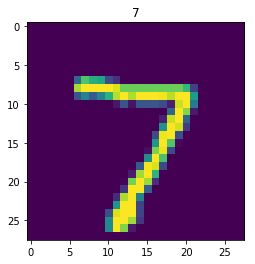

In [4]:
import matplotlib.pyplot as plt

img = test_images[0]
print img.shape
print img.shape[:2]
plt.imshow(img.reshape(img.shape[:2]))
plt.title(test_labels[0])
plt.show()


In [3]:
# How model predicted
np.set_printoptions(suppress=True,precision=5)
pred = model.predict(img.reshape(1,28,28,1))
print pred,
print np.argmax(pred)

[[0.      0.      0.      0.      0.      0.      0.      0.99999 0.
  0.     ]] 7


# Basic functions

In [20]:
from tensorflow.keras import backend as K

def layer_output(i, x):
    # with a Sequential model
    func = K.function([model.layers[0].input],
                        [model.layers[i].output])
    output = func([x])[0]
    return output

def draw_kernel(k, i, total, out):
    k_img = k.numpy()
    n = k.shape[2];
    k_data = k_img.reshape((n, -1))
    print "kernel ", i, "/", total, ": ", k.shape #, k_data

    w = np.ceil(np.sqrt(n+1)) # including the final result
    h = np.ceil((n + 1) / w)
    fig = plt.figure(figsize=(15, 8))
    for j in range(n):
        # draw kernel table
        plt.subplot(w, h, 1 + j)
        tbl = k_img[:,:,j]
        tbl = np.round(tbl, decimals=2)
        plt.xticks([])
        plt.yticks([])
        plt.table(cellText=tbl, loc="center")
        
    # draw out img
    print "kernel output: ", out.shape
    shape = out.shape[1:3]
    plt.subplot(w, h, n)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(out.reshape(shape), cmap=plt.cm.binary)

    plt.show()
    plt.close()

def draw_pooling(i, x, x_title, y=None, y_title=None):
    print "pooling ", i, ": ", x.shape
    
    plt.subplot(1, 2, 1)
    shape = x.shape[1:3]
    plt.xticks([])
    plt.yticks([])
    plt.imshow(x.reshape(shape), cmap=plt.cm.binary)
    
    plt.show()
    plt.close()

def draw_dense(k, i, n):
    print "kernel ", i, "/", n, ": ", k
    

def draw_layer(n):
    l = model.layers[n]
    print "layer: ", n
    print "input: ", l.input
    print "output: ", l.output
    imodel=tf.keras.Model(inputs=model.input, outputs=l.output)
    out = imodel.predict(img.reshape(1,28,28,1))
    print "output shape: ", out.shape
    total = out.shape[-1]
    if isinstance(l, layers.Conv2D):
        print "bias: ", l.bias
        print "kernel shape: ", l.kernel.shape
        for i in range(total):
            k = l.kernel[:,:,:,i]
            draw_kernel(k, i, total, out[:,:,:,i])
    if isinstance(l, layers.MaxPooling2D):
        print "pooling: ", l.pool_size
        for i in range(total):
            x = out[:,:,:,i]
            draw_pooling(i, x, i)
    if isinstance(l, layers.Dense):
        print "kernel shape: ", l.kernel.shape
        print "bias: ", l.bias
        for i in range(total):
            k = l.kernel[:,i]
            draw_dense(k, i, total)
        


# parameters of last layer

about how to get output of intermediate layer:
    https://keras.io/getting-started/faq/#how-can-i-obtain-the-output-of-an-intermediate-layer

In [16]:
# The last 2 layers
# dense (Dense)                (None, 64)                36928     
# _________________________________________________________________
# dense_1 (Dense)              (None, 10)                650       

# for the last layer(-1), output is 10, used for argmax, indicate possiblity of each 0-9
# input is output of layer[-2], shape(,64), so shape of kernel should be: (64,10)
# So output of last layer is:
#     np.dot(output_of_last_layer, layer.kernel) + layer.bias

draw_layer(-1)

layer:  -1
input:  Tensor("dense/Identity:0", shape=(None, 64), dtype=float32)
output:  Tensor("dense_1/Identity:0", shape=(None, 10), dtype=float32)
output shape:  (1, 10)
bias:  <tf.Variable 'dense_1/bias:0' shape=(10,) dtype=float32, numpy=
array([-0.00362,  0.01029, -0.0107 , -0.01939, -0.00346, -0.0211 ,
        0.00097,  0.00685,  0.03365,  0.00072], dtype=float32)>
kernel shape:  (64, 10)
kernel  0 / 10 :  tf.Tensor(
[ 0.0984  -0.20309 -0.19907  0.10074 -0.01971  0.22577 -0.06189 -0.04964
 -0.29506 -0.02564  0.17173  0.1707  -0.29428  0.00859 -0.12548 -0.04202
 -0.07235  0.14048  0.14476  0.26276 -0.30405  0.25595 -0.07472  0.04487
 -0.06523 -0.13047  0.12959  0.2093  -0.17387  0.09122 -0.08001 -0.07838
 -0.29386 -0.33409  0.20332 -0.23011 -0.04364 -0.03627 -0.17847 -0.29676
 -0.27208 -0.06785  0.12531 -0.01124  0.20364 -0.07795  0.2618  -0.16323
 -0.271   -0.0338   0.02829 -0.08686  0.09336  0.2082   0.00366  0.10565
  0.10708  0.21678 -0.24013  0.18143  0.01835  0.11912 -0.222

In [18]:
draw_layer(-2)

layer:  -2
input:  Tensor("flatten/Identity:0", shape=(None, 576), dtype=float32)
output:  Tensor("dense/Identity:0", shape=(None, 64), dtype=float32)
output shape:  (1, 64)
bias:  <tf.Variable 'dense/bias:0' shape=(64,) dtype=float32, numpy=
array([ 0.02197,  0.01833, -0.00739,  0.01137, -0.00216,  0.00371,
        0.00224, -0.01084, -0.01436, -0.00719,  0.01567, -0.0249 ,
        0.03196, -0.01201, -0.01361,  0.01181,  0.0034 ,  0.01596,
       -0.00713,  0.01454,  0.00523,  0.01547, -0.00143, -0.00426,
        0.00638, -0.01196, -0.01976,  0.00884,  0.00782, -0.00673,
        0.03576,  0.01058,  0.01376,  0.02521,  0.01657, -0.00289,
        0.00825,  0.00233,  0.02314, -0.00892, -0.02144,  0.00656,
       -0.00187, -0.00986, -0.0265 ,  0.02266,  0.01593, -0.00885,
        0.01576,  0.00175,  0.0092 ,  0.00083,  0.0065 ,  0.01019,
       -0.01751,  0.01508,  0.01678,  0.00995, -0.0312 , -0.03688,
        0.00225, -0.02557,  0.0118 ,  0.02051], dtype=float32)>
kernel shape:  (576, 64

In [10]:
# get output of layer[-2]
imodel=tf.keras.Model(inputs=model.input, outputs=model.layers[-2].output)
layer_out = imodel.predict(img.reshape(1,28,28,1))
print layer_out # This is numbers that represent the whole picutre?!
print layer_out.shape # please note that output is "relu", all "> 0"

[[ 0.       0.       7.33566  0.       5.60199  3.07637  4.14881  5.56929
   0.       0.       0.12808  0.       0.       0.       6.60969  0.
   9.24778  0.       0.       4.66248  0.      10.58612  1.43942  0.43878
   0.       0.       0.       0.       0.       0.       0.       4.75653
   4.17517  0.       0.       0.       0.       0.       0.       0.
   0.94336  0.       0.       0.       0.       2.82531  5.88451  0.
   0.       0.       0.       0.47599  0.       0.       0.       0.
   0.       0.       0.       1.65782  1.44773  5.53673  0.       0.27994]]
(1, 64)


In [11]:
print model.layers[-1].kernel.shape
r = np.dot(layer_out, model.layers[-1].kernel.numpy())
r += model.layers[-1].bias
print r.shape
print r[0,7] # result of number 7
print r
r = tf.nn.relu(r) # Layer(-2) uses Relu
print "relu: ", r
print "softmax: ", tf.nn.softmax(r) # OK, we got correct expectation now
print "predict: ", pred

(64, 10)
(1, 10)
tf.Tensor(13.541119, shape=(), dtype=float32)
tf.Tensor(
[[-2.27669  2.50301  1.99718  0.94133 -1.94672 -2.97838 -8.3713  13.54112
  -0.1514  -2.07374]], shape=(1, 10), dtype=float32)
relu:  tf.Tensor(
[[ 0.       2.50301  1.99718  0.94133  0.       0.       0.      13.54112
   0.       0.     ]], shape=(1, 10), dtype=float32)
softmax:  tf.Tensor(
[[0.      0.00002 0.00001 0.      0.      0.      0.      0.99996 0.
  0.     ]], shape=(1, 10), dtype=float32)
predict:  [[0.      0.00002 0.00001 0.      0.      0.      0.      0.99997 0.
  0.     ]]


In [12]:
# let's see what leads to "7" in layer[-2]
print model.layers[-1].kernel.shape
k7 = model.layers[-1].kernel[:,7]
r = np.dot(layer_out, k7.numpy())
r += model.layers[-1].bias[7]
print r.shape
print r # exactly same to 


(64, 10)
(1,)
tf.Tensor([13.54112], shape=(1,), dtype=float32)


[[ 0.       0.       7.33566  0.       5.60199  3.07637  4.14881  5.56929
   0.       0.       0.12808  0.       0.       0.       6.60969  0.
   9.24778  0.       0.       4.66248  0.      10.58612  1.43942  0.43878
   0.       0.       0.       0.       0.       0.       0.       4.75653
   4.17517  0.       0.       0.       0.       0.       0.       0.
   0.94336  0.       0.       0.       0.       2.82531  5.88451  0.
   0.       0.       0.       0.47599  0.       0.       0.       0.
   0.       0.       0.       1.65782  1.44773  5.53673  0.       0.27994]]
tf.Tensor(
[-0.37366 -0.09012  0.28799 -0.10961  0.02752 -0.21416  0.23254  0.11859
  0.08711 -0.15807  0.00148 -0.02029 -0.22707 -0.12626  0.32788 -0.11726
  0.23501 -0.02663  0.08907  0.15721 -0.09158  0.23765 -0.1212   0.00477
 -0.01167 -0.22595  0.03432  0.07796 -0.20776 -0.20401  0.21102  0.03597
 -0.02426 -0.23101 -0.19686 -0.18543 -0.21009 -0.13932  0.2001   0.07277
 -0.31092  0.07277  0.01543 -0.15918 -0.32418  0.2

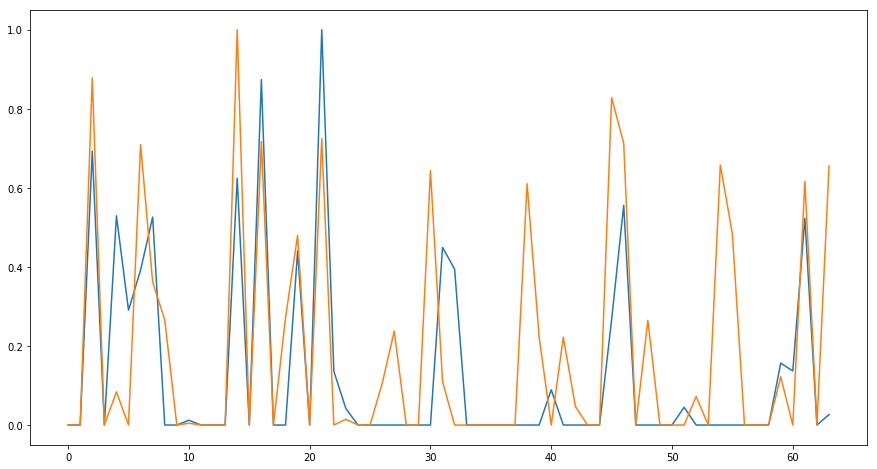

In [13]:
print layer_out
print k7
# print layer_out * k7
print tf.nn.relu(layer_out *k7)
fig = plt.figure(figsize=(15, 8))
plt.plot(layer_out[0]/np.max(layer_out[0]))
plt.plot(tf.nn.relu(k7 / np.max(k7)))
plt.show() 


# dense layer parsing by out index

out = in * weight + bias
Let's trace which inputs contributes most the output

In [52]:
# for a giveng dense output, which inputs and parameters leads to it?
def draw_dense_i(layer, index):
    l = model.layers[layer]
    input = layer_output(layer - 1, img.reshape(1,28,28,1))
    output = layer_output(layer, img.reshape(1,28,28,1))
    print "layer: ", layer
    print "input: ", input.shape, input
    print "output: ", output.shape, output
    print "output ", index, "/", output.shape[1], ": ", output[0][index]
    print "kernel: ", l.kernel.shape
    k_i = l.kernel[:,index] # kernel that related to value calculation at index.
    print "kernel ", index, ": ", k_i
    r_i = input[0] * k_i # full dense means: all inputs * weight[index] + bias 
    print "intput * kernel: ", np.sum(r_i), r_i
    # r_i = tf.nn.softmax(r_i)
    fig = plt.figure(figsize=(15, 8))
    plt.plot(input[0]/np.max(input[0]), label='input')
    plt.plot(k_i / np.max(k_i), 'r+--', label='kernel')
    plt.plot(r_i / np.max(r_i), 'bo', label='result')
    plt.legend()
    plt.show() 
    
    i = np.argmax(input[0])
    print "max input: ", i, " : ", input[0][i]
    i = np.argmax(k_i)
    print "max kernel: ", i, " : ", k_i[i]
    i = np.argmax(r_i)
    print "max result: ", i, " : ", r_i[i]
    
    # top 10 result and inputs:
    t10 = r_i.numpy().argsort()[::-1][:10]
    print "top 10 result index: ", t10
    print "top 10 result value: ", r_i.numpy()[t10]
    print "top 10 input value: ", input[0][t10]



layer:  -1
input:  (1, 64) [[3.30214 0.      0.      1.20453 0.      0.      0.      0.      1.24936
  0.      4.44399 0.      1.19877 0.      0.      1.98789 4.64866 0.27911
  0.      5.72456 0.      0.93196 4.46841 3.32173 6.45032 0.      0.
  2.71435 4.30749 0.      6.12824 0.      6.77481 0.      0.      0.
  0.      0.      8.70561 0.      0.      0.      0.      0.      0.
  0.61571 0.34533 1.83897 2.50681 2.40195 0.      4.44498 0.      3.39808
  1.47222 0.      0.      0.66754 0.      0.      0.      0.      0.
  0.28968]]
output:  (1, 10) [[0.      0.      0.      0.      0.      0.      0.      0.99999 0.
  0.     ]]
output  7 / 10 :  0.9999938
kernel:  (64, 10)
kernel  7 :  tf.Tensor(
[ 0.13331 -0.06564 -0.19504 -0.0477  -0.33269 -0.22262  0.1656  -0.0884
 -0.17467 -0.19528  0.25743 -0.11298 -0.07287 -0.20404 -0.16375  0.07168
  0.2634  -0.04246 -0.03869  0.22509  0.06254  0.04595  0.18405 -0.02219
  0.29697 -0.21485 -0.03291 -0.00659  0.1285  -0.22395  0.24895 -0.3087
  0.2

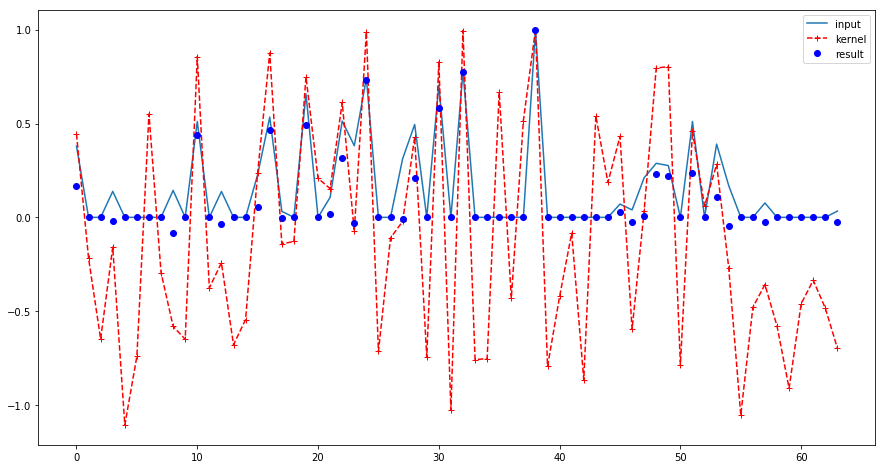

max input:  38  :  8.705614
max kernel:  38  :  tf.Tensor(0.3005833, shape=(), dtype=float32)
max result:  38  :  tf.Tensor(2.6167622, shape=(), dtype=float32)
top 10 result index:  [38 32 24 30 19 16 10 22 51 48]
top 10 result value:  [2.61676 2.02688 1.91553 1.52561 1.28854 1.22446 1.144   0.8224  0.6127
 0.59941]
top 10 input value:  [8.70561 6.77481 6.45032 6.12824 5.72456 4.64866 4.44399 4.46841 4.44498
 2.50681]


In [53]:
# what's lead to result 7?
draw_dense_i(-1, 7)


layer:  -2
input:  (1, 576) [[0.      0.      0.      0.      0.18965 1.15389 1.4305  0.      0.
  0.      2.78816 0.      0.      0.      1.24672 0.      0.91785 0.
  0.      0.      1.67361 0.13841 0.      0.      2.12661 0.      3.0009
  0.      0.      1.85427 0.      2.37275 0.      0.      0.57183 1.56614
  0.      0.      2.95576 0.      1.99224 0.      3.46311 2.30326 1.61219
  0.      0.      1.41077 0.      0.      0.      0.      0.00492 0.80443
  0.      0.      0.      0.31416 0.94462 0.      0.      0.14997 0.
  0.      0.      0.      0.      0.      1.11191 2.10722 0.92729 0.
  0.      0.      3.54215 0.      0.      0.4685  1.55944 0.      0.55664
  0.      0.      0.      1.83044 0.      0.      0.      1.45793 0.
  2.7229  0.      0.      1.58042 0.      1.85263 0.      0.      0.61047
  0.37774 0.      0.      1.50445 0.      1.42876 0.      2.67838 1.42538
  1.53523 0.      0.      0.73723 0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.52427

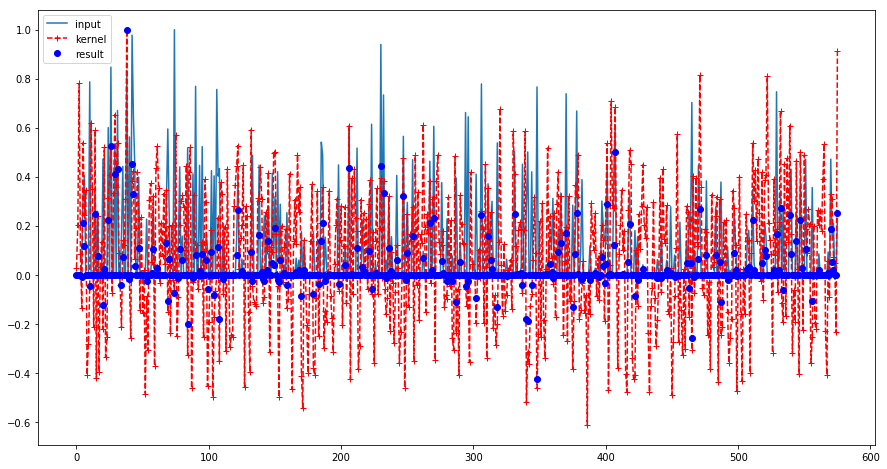

max input:  74  :  3.5421524
max kernel:  38  :  tf.Tensor(0.25026754, shape=(), dtype=float32)
max result:  38  :  tf.Tensor(0.73973125, shape=(), dtype=float32)
top 10 result index:  [ 38  26 407  42 230 206  31  29 232  43]
top 10 result value:  [0.73973 0.38722 0.37104 0.33291 0.32947 0.32325 0.31893 0.30338 0.24818
 0.24349]
top 10 input value:  [2.95576 3.0009  2.17112 3.46311 3.32921 2.12422 2.37275 1.85427 2.59851
 2.30326]


In [54]:
draw_dense_i(-2, 38)

# top 10 result index:  [ 38  26 407  42 230 206  31  29 232  43]
# top 10 input value:  [2.95576 3.0009  2.17112 3.46311 3.32921 2.12422 2.37275 1.85427 2.59851 2.30326]

# layer 4 which maxpool result to size: 3x3x64=567
# 3x3 picutre = index % 64
# pixes = (index/64).reshape((3,3))
# index 38: located in output 38, pixel 0,0
# index 26: located in output 26, pixel 0,0
# index 407: located in output 23, pixel 2,0
# index 42: ocated in output 42, pixel 0,0
# ...

# please find them in layer 4 pictures, each pixel is black!


# back tracing to pooling/conv2d layer

In [141]:
def draw_2d_i(layer, index):
    l = model.layers[layer]
    input = layer_output(layer - 1, img.reshape(1,28,28,1))
    output = layer_output(layer, img.reshape(1,28,28,1))
    print "layer: ", layer, l
    print "input: ", input.shape #, input
    print "kernel: ", l.kernel.shape
    print "output: ", output.shape #, output
    
    shape = output.shape
    pic = index % shape[3]
    row_col = index / shape[3]
    row = row_col / shape[1]
    col = row_col % shape[1]
    print "output ", index, ": pic ", pic, ", pixel ", row, ",", col
    print "output value at index: ", output[0][row][col][pic]
    
    k_i = l.kernel[:,:,:,pic] # kernel that related to value calculation at index.
    print "kernel at index: ", k_i.shape
    
    in_i = input.reshape(input.shape[1:])
    in_i = in_i[np.ix_(range(row,row+shape[1]),range(col,col+shape[2]))]
    print "input at index: ", in_i.shape
    
    r_i = in_i * k_i
    print "intput * kernel: ", np.sum(r_i), r_i.shape
    
    r_i = np.sum(r_i, axis=(0,1))
    k_i = np.sum(k_i, axis=(0,1))
    in_i = in_i.sum(axis=(0,1))
    
    fig = plt.figure(figsize=(15, 8))
    plt.plot(in_i/np.max(in_i), label='input')
    plt.plot(k_i / np.max(k_i), 'r+--', label='kernel')
    plt.plot(r_i / np.max(r_i), 'bo', label='result')
    plt.legend()
    plt.show() 
    
    # top 10 result and inputs:
    print "in * kernel at index: ", r_i
    t10 = r_i.argsort()
    t10 = t10[-1:-10:-1]
    print "top 10 result index: ", t10
    print "top 10 result value: ", r_i[t10]
    print "top 10 input value: ", in_i[t10]
    
    # draw picture
    fig = plt.figure(figsize=(15, 8))
    print("input layer{}, location:{},{}, size:{},{}".format(layer-1,row,col,shape[1],shape[2]))
    for i in range(9):
        t = t10[i]
        img_i = input[0,:,:,t]
        plt.subplot(3, 3, 1 + i)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(img_i, cmap=plt.cm.binary)
        plt.title("{}: {:.2f} * {:.2f} = {:.2f}".format(t,in_i[t],k_i[t], r_i[t]))
    plt.show()
    plt.close()


layer:  4 <tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f81160f1e10>
input:  (1, 5, 5, 64)
kernel:  (3, 3, 64, 64)
output:  (1, 3, 3, 64)
output  38 : pic  38 , pixel  0 , 0
output value at index:  2.955762
kernel at index:  (3, 3, 64)
input at index:  (3, 3, 64)
intput * kernel:  2.9765263 (3, 3, 64)


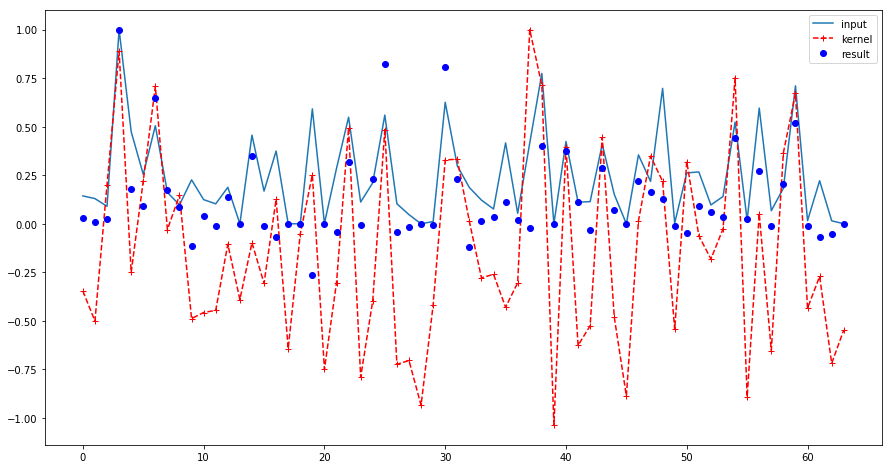

in * kernel at index:  [ 0.0118   0.0026   0.01009  0.38167  0.06844  0.03532  0.24741  0.0659
  0.03239 -0.0444   0.01565 -0.00463  0.0528   0.       0.13313 -0.00448
 -0.02554  0.       0.      -0.09985 -0.00077 -0.01639  0.12211 -0.00265
  0.0873   0.31326 -0.01551 -0.00549  0.      -0.0024   0.30922  0.0881
 -0.04633  0.00577  0.01312  0.0423   0.00691 -0.0075   0.15319  0.
  0.14276  0.04212 -0.01269  0.10888  0.0266   0.       0.08315  0.06317
  0.0479  -0.00343 -0.01802  0.034    0.02367  0.01295  0.16861  0.00979
  0.10379 -0.00526  0.07848  0.19813 -0.00429 -0.02533 -0.02099  0.     ]
top 10 result index:  [ 3 25 30  6 59 54 38 40 14]
top 10 result value:  [0.38167 0.31326 0.30922 0.24741 0.19813 0.16861 0.15319 0.14276 0.13313]
top 10 input value:  [6.91856 3.87422 4.32993 3.4952  4.9167  3.62156 5.36014 2.93312 3.1594 ]
input layer3, location:0,0, size:3,3


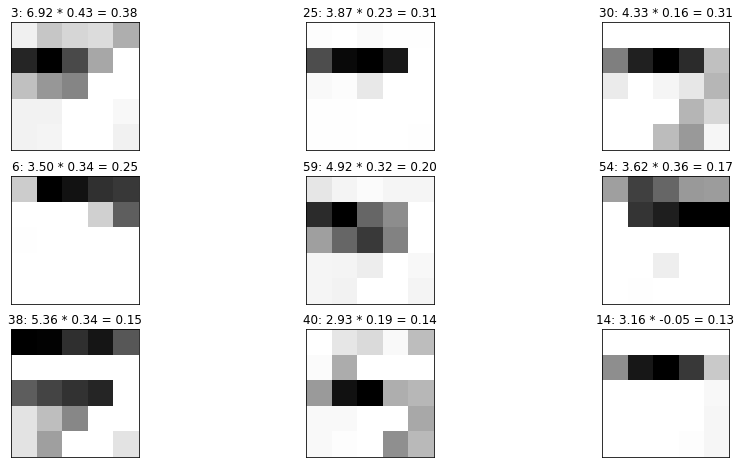

In [142]:
draw_2d_i(4, 38)
# output  38 : pic  38 , pixel  0 , 0
# top 10 result index:  [ 3 25 30  6 59 54 38 40 14 22]
# layer 3, output 3, 6 at pixel 0,0,(3x3) contributes max
# layer 3 is pooling by 2x2, so when you check layer 2, similar image.

In [143]:
# layer 3, output of kernel 3
draw_2d_i(3, 3)


layer:  3 <tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f81160fbf50>
input:  (1, 11, 11, 64)
kernel: 

AttributeError: 'MaxPooling2D' object has no attribute 'kernel'

# Now, let's see first layer[0]

What is the layer parameters and what they output

layer:  0
input:  Tensor("conv2d_3_input:0", shape=(None, 28, 28, 1), dtype=float32)
output:  Tensor("conv2d_3/Identity:0", shape=(None, 26, 26, 32), dtype=float32)
output shape:  (1, 26, 26, 32)
bias:  <tf.Variable 'conv2d_3/bias:0' shape=(32,) dtype=float32, numpy=
array([-0.03557, -0.00573, -0.01445,  0.03444, -0.00848, -0.01297,
       -0.03185, -0.00992, -0.00277, -0.00228, -0.00435, -0.02875,
       -0.0367 ,  0.04571, -0.01474, -0.00632, -0.00637,  0.06001,
        0.01395, -0.01065, -0.0587 , -0.05351, -0.00467,  0.07118,
       -0.00522, -0.0151 , -0.06198, -0.02659, -0.02245,  0.11129,
       -0.0348 , -0.01445], dtype=float32)>
kernel shape:  (3, 3, 1, 32)
kernel  0 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


/home/xuemingl/.local/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


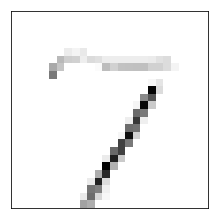

kernel  1 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


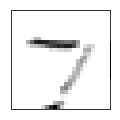

kernel  2 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


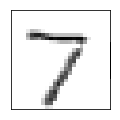

kernel  3 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


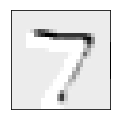

kernel  4 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


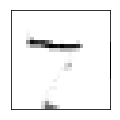

kernel  5 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


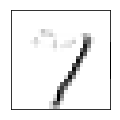

kernel  6 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


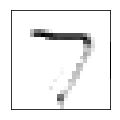

kernel  7 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


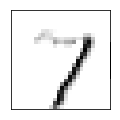

kernel  8 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


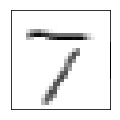

kernel  9 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


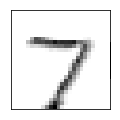

kernel  10 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


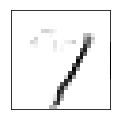

kernel  11 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


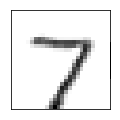

kernel  12 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


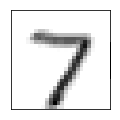

kernel  13 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


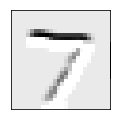

kernel  14 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


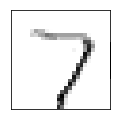

kernel  15 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


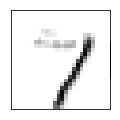

kernel  16 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


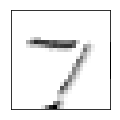

kernel  17 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


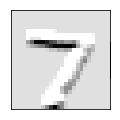

kernel  18 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


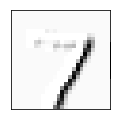

kernel  19 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


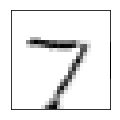

kernel  20 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


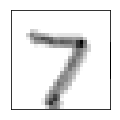

kernel  21 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


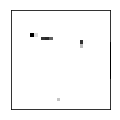

kernel  22 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


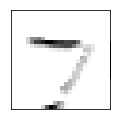

kernel  23 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


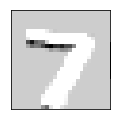

kernel  24 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


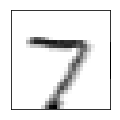

kernel  25 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


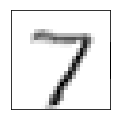

kernel  26 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


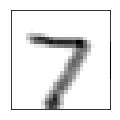

kernel  27 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


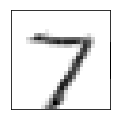

kernel  28 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


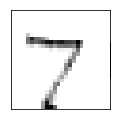

kernel  29 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


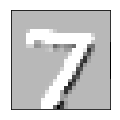

kernel  30 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


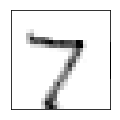

kernel  31 / 32 :  (3, 3, 1)
kernel output:  (1, 26, 26)


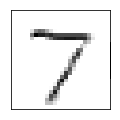

In [15]:
# model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
draw_layer(0)

# Layer 1 and following

layer:  1
input:  Tensor("conv2d_3/Identity:0", shape=(None, 26, 26, 32), dtype=float32)
output:  Tensor("max_pooling2d_2/Identity:0", shape=(None, 13, 13, 32), dtype=float32)
output shape:  (1, 13, 13, 32)
pooling:  (2, 2)
pooling  0 :  (1, 13, 13)


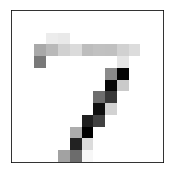

pooling  1 :  (1, 13, 13)


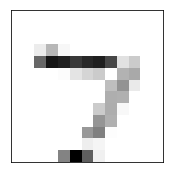

pooling  2 :  (1, 13, 13)


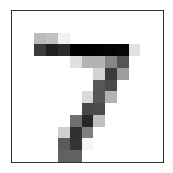

pooling  3 :  (1, 13, 13)


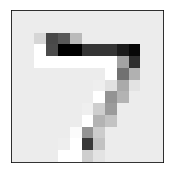

pooling  4 :  (1, 13, 13)


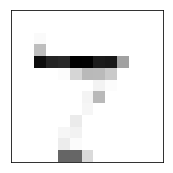

pooling  5 :  (1, 13, 13)


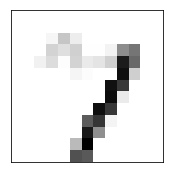

pooling  6 :  (1, 13, 13)


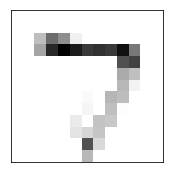

pooling  7 :  (1, 13, 13)


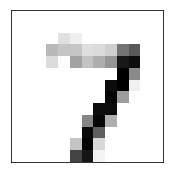

pooling  8 :  (1, 13, 13)


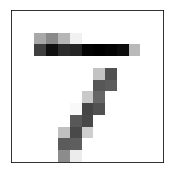

pooling  9 :  (1, 13, 13)


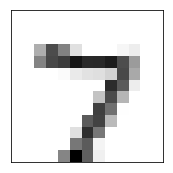

pooling  10 :  (1, 13, 13)


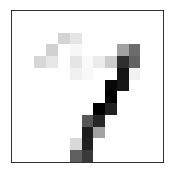

pooling  11 :  (1, 13, 13)


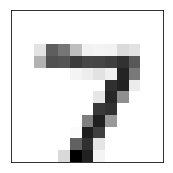

pooling  12 :  (1, 13, 13)


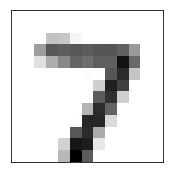

pooling  13 :  (1, 13, 13)


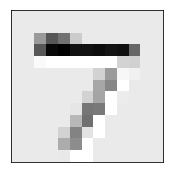

pooling  14 :  (1, 13, 13)


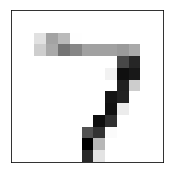

pooling  15 :  (1, 13, 13)


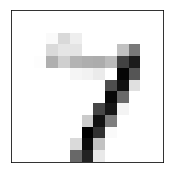

pooling  16 :  (1, 13, 13)


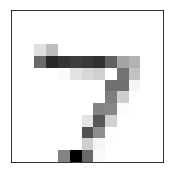

pooling  17 :  (1, 13, 13)


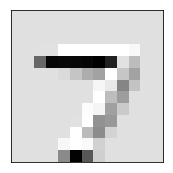

pooling  18 :  (1, 13, 13)


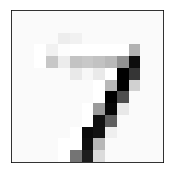

pooling  19 :  (1, 13, 13)


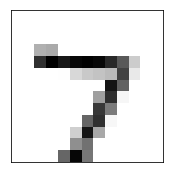

pooling  20 :  (1, 13, 13)


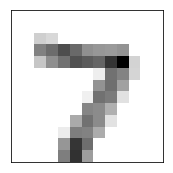

pooling  21 :  (1, 13, 13)


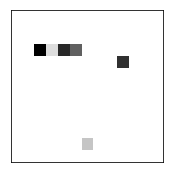

pooling  22 :  (1, 13, 13)


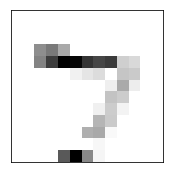

pooling  23 :  (1, 13, 13)


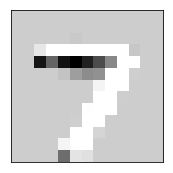

pooling  24 :  (1, 13, 13)


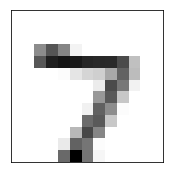

pooling  25 :  (1, 13, 13)


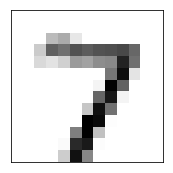

pooling  26 :  (1, 13, 13)


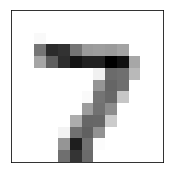

pooling  27 :  (1, 13, 13)


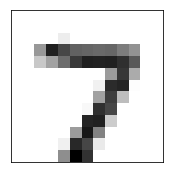

pooling  28 :  (1, 13, 13)


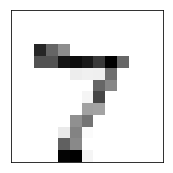

pooling  29 :  (1, 13, 13)


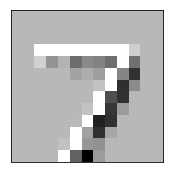

pooling  30 :  (1, 13, 13)


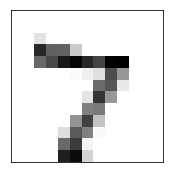

pooling  31 :  (1, 13, 13)


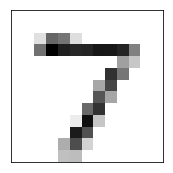

In [16]:
# model.add(layers.MaxPooling2D((2, 2)))
draw_layer(1)

 layer:  2
input:  Tensor("max_pooling2d_2/Identity:0", shape=(None, 13, 13, 32), dtype=float32)
output:  Tensor("conv2d_4/Identity:0", shape=(None, 11, 11, 64), dtype=float32)
output shape:  (1, 11, 11, 64)
bias:  <tf.Variable 'conv2d_4/bias:0' shape=(64,) dtype=float32, numpy=
array([-0.00097,  0.01671, -0.01542, -0.00234, -0.04833, -0.03494,
        0.00771, -0.03203,  0.02737,  0.0028 ,  0.04084,  0.01307,
       -0.02807, -0.04778, -0.03342, -0.04864, -0.02768, -0.02401,
        0.01202, -0.01618, -0.0136 , -0.05742, -0.01972, -0.04977,
       -0.03322, -0.00995, -0.00485, -0.02225, -0.03499, -0.00152,
       -0.01594, -0.00819,  0.00563, -0.01137,  0.00983, -0.02807,
       -0.03173, -0.00661,  0.01304, -0.01774, -0.00862, -0.05409,
        0.01653, -0.00387, -0.0456 , -0.01273, -0.01693, -0.03024,
       -0.028  , -0.00387, -0.03285, -0.01211, -0.0205 , -0.03691,
        0.00587, -0.02304, -0.04742, -0.05037, -0.03421,  0.00749,
       -0.01822, -0.03185, -0.0531 , -0.04728], dt

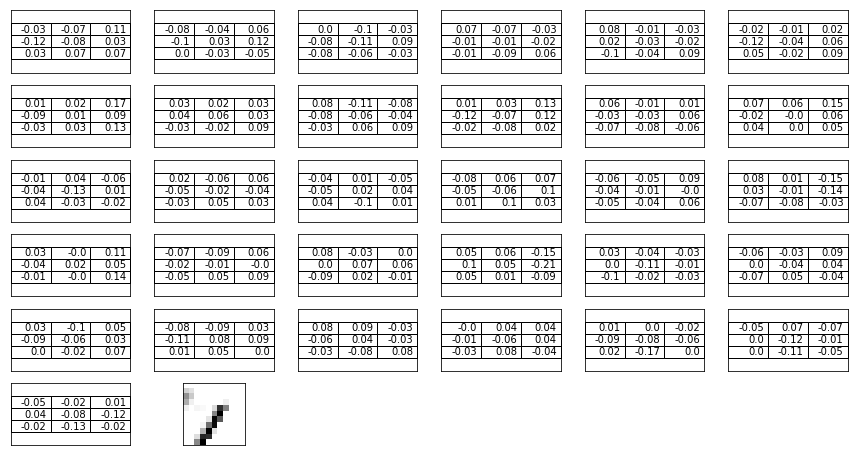

kernel  1 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


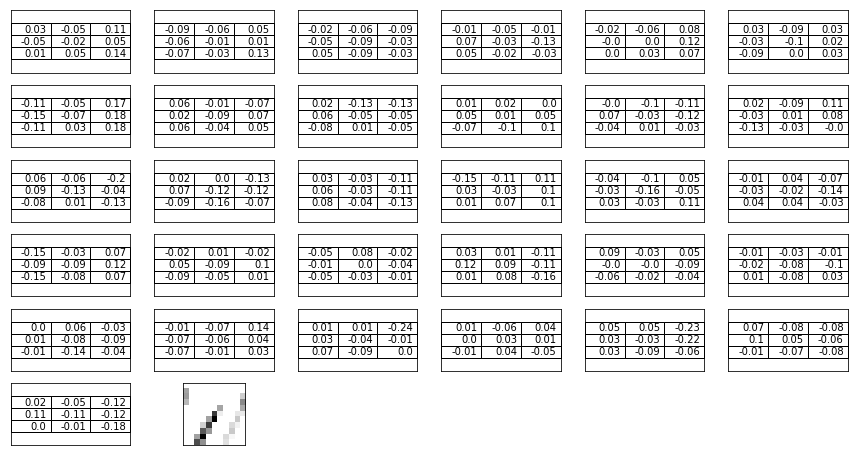

kernel  2 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


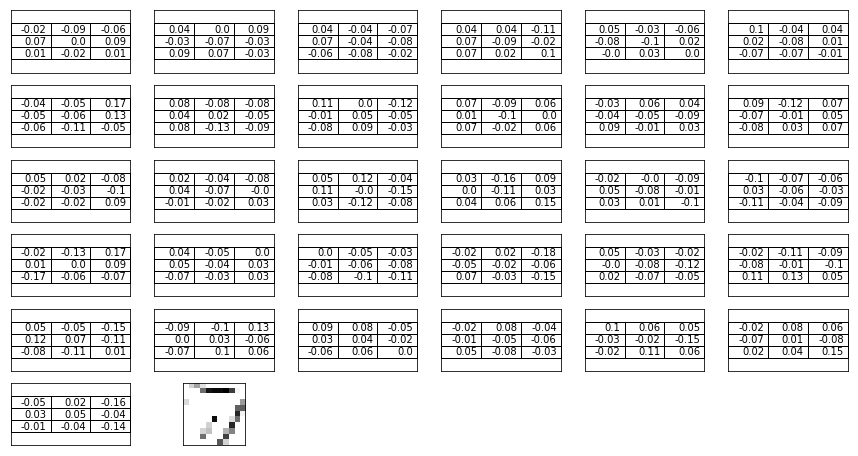

kernel  3 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


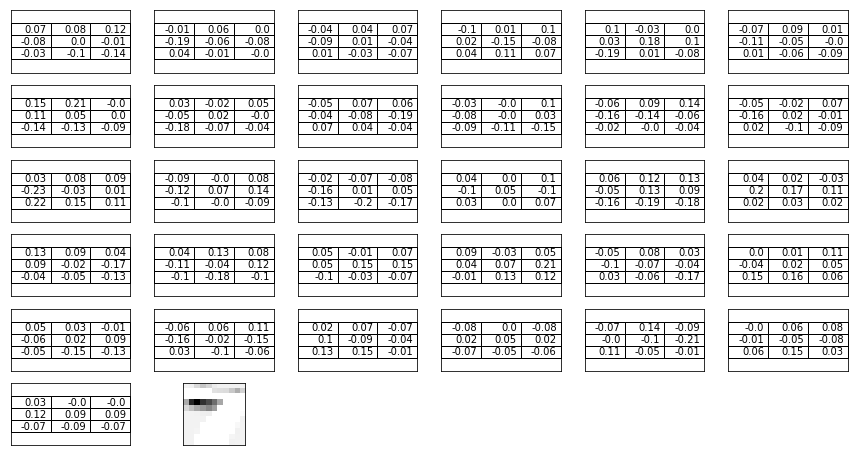

kernel  4 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


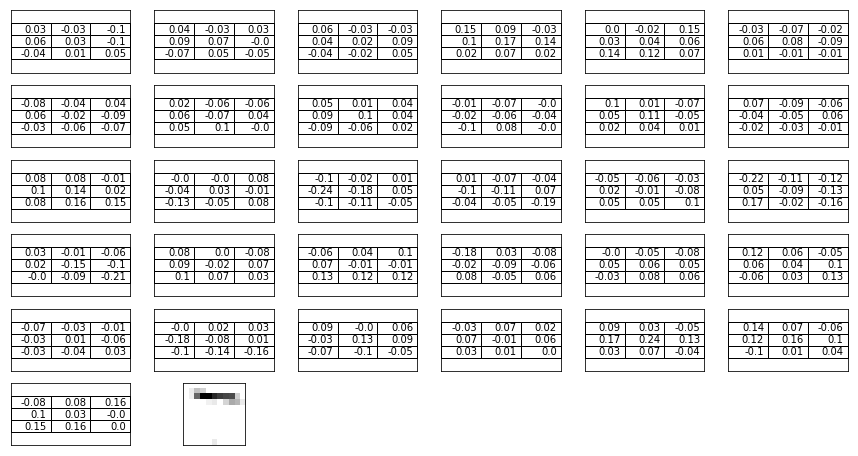

kernel  5 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


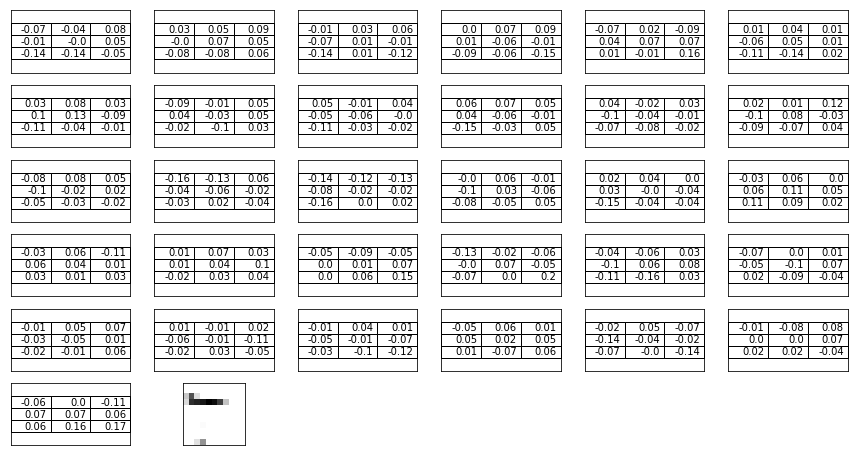

kernel  6 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


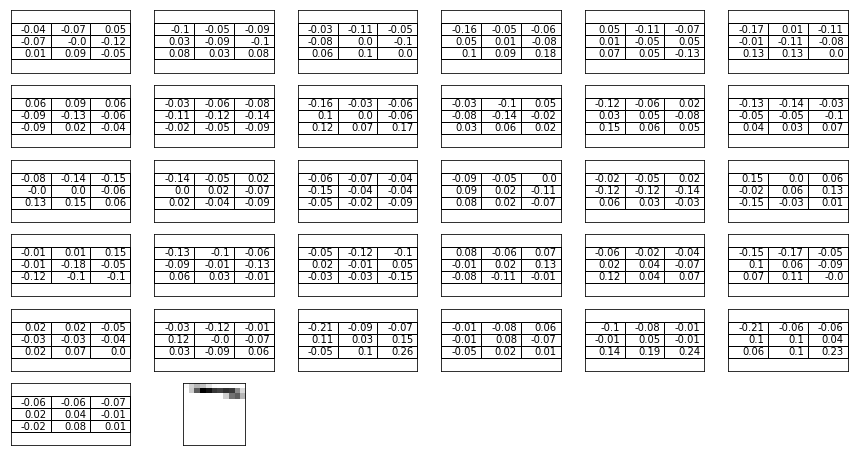

kernel  7 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


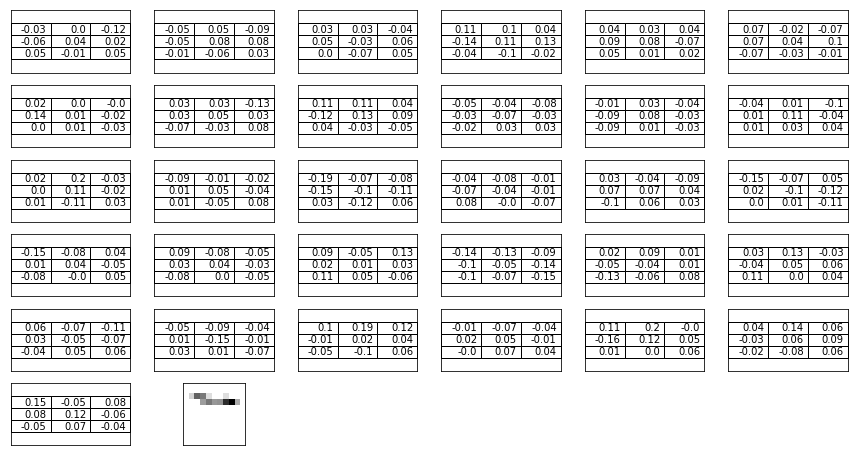

kernel  8 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


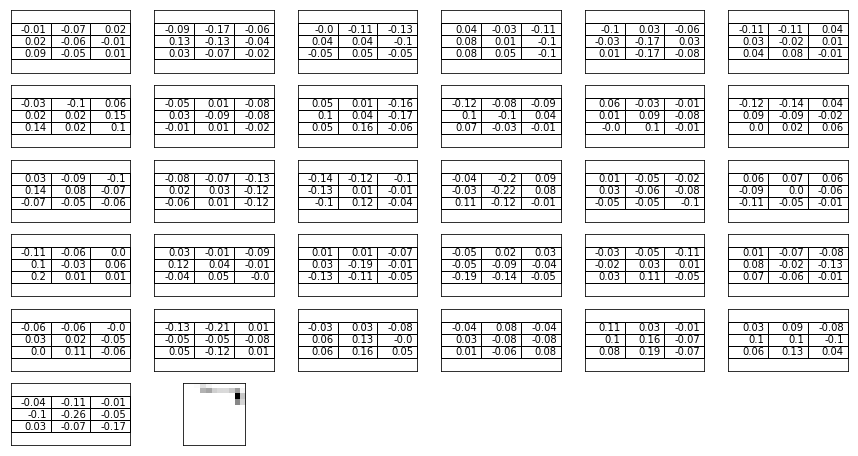

kernel  9 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


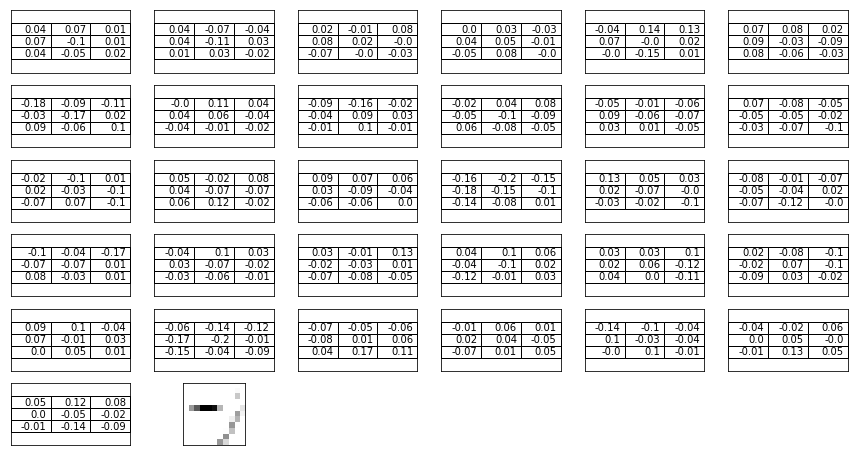

kernel  10 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


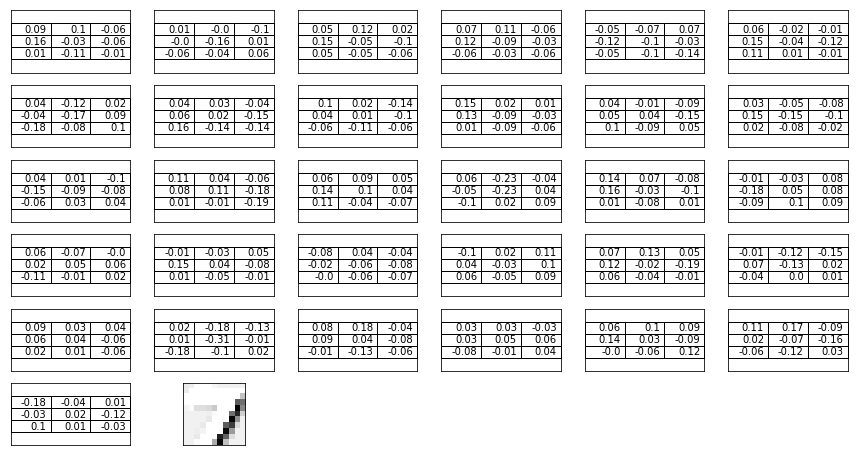

kernel  11 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


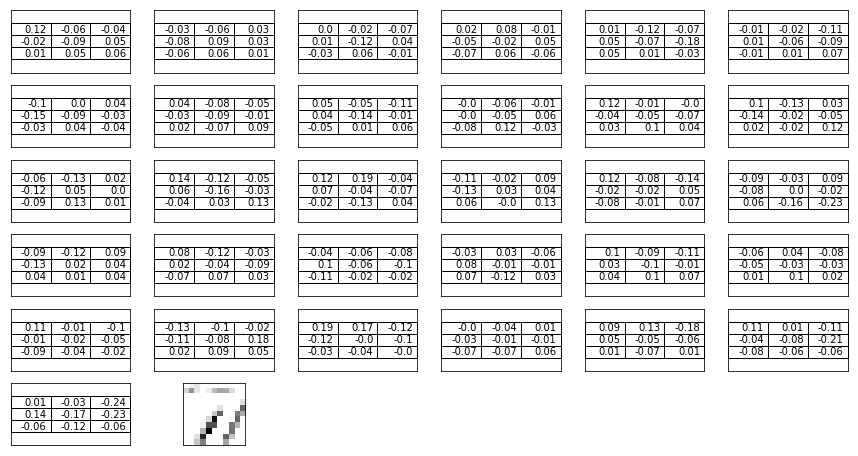

kernel  12 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


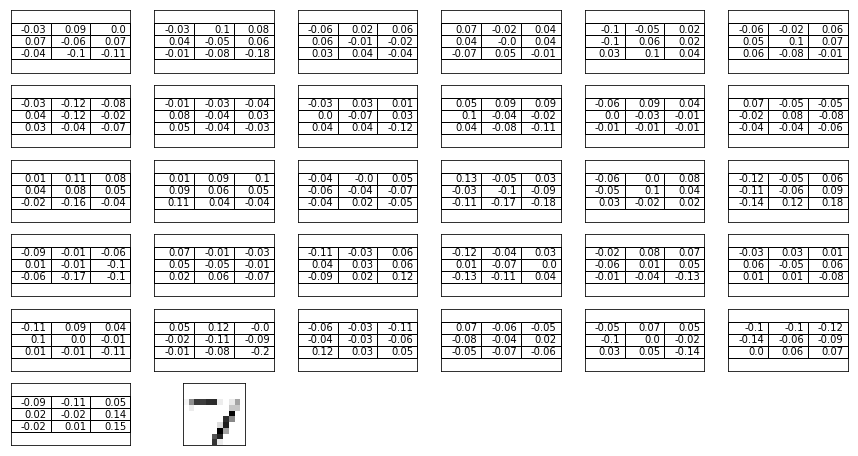

kernel  13 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


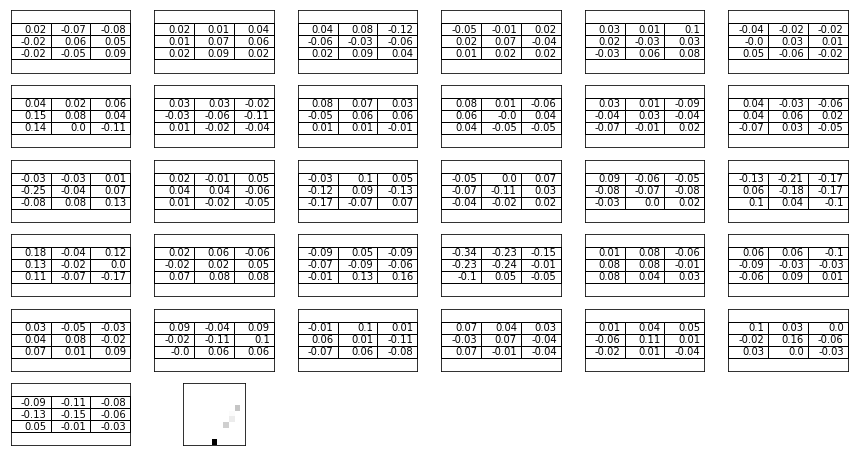

kernel  14 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


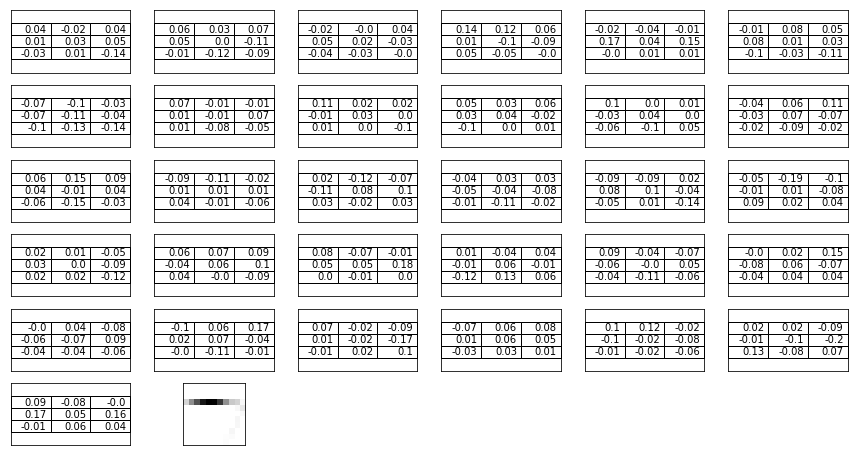

kernel  15 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


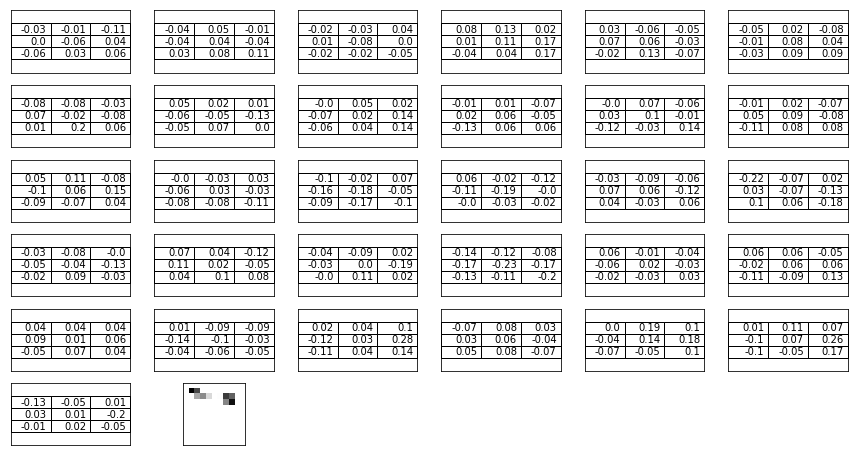

kernel  16 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


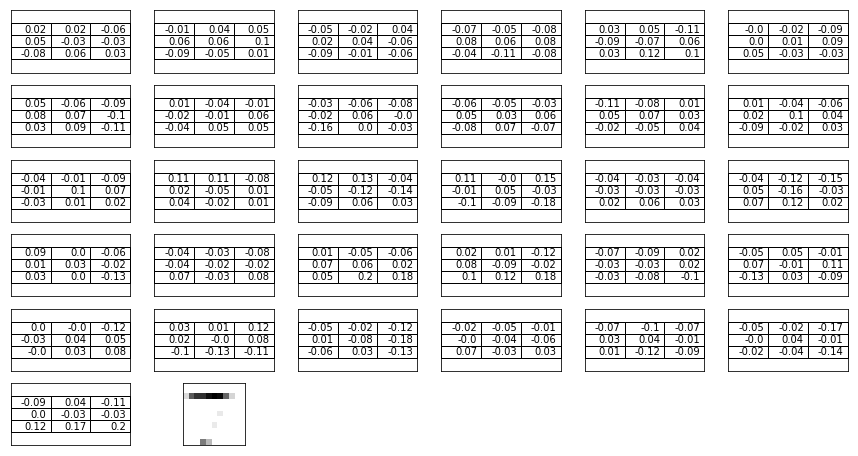

kernel  17 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


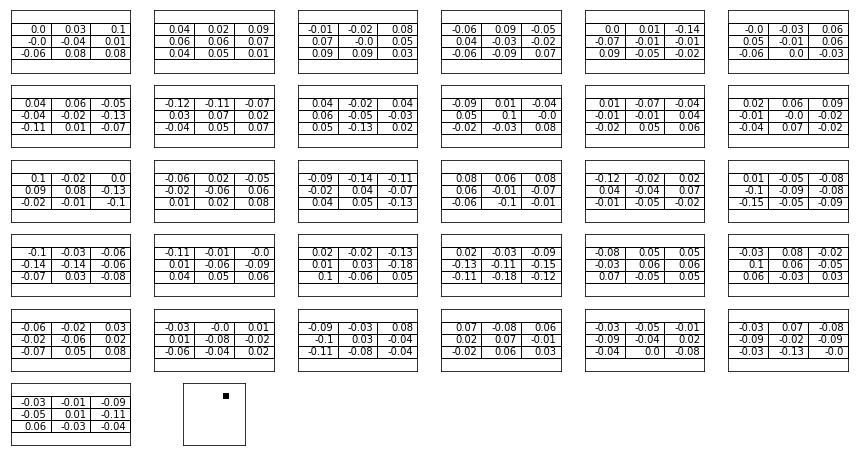

kernel  18 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


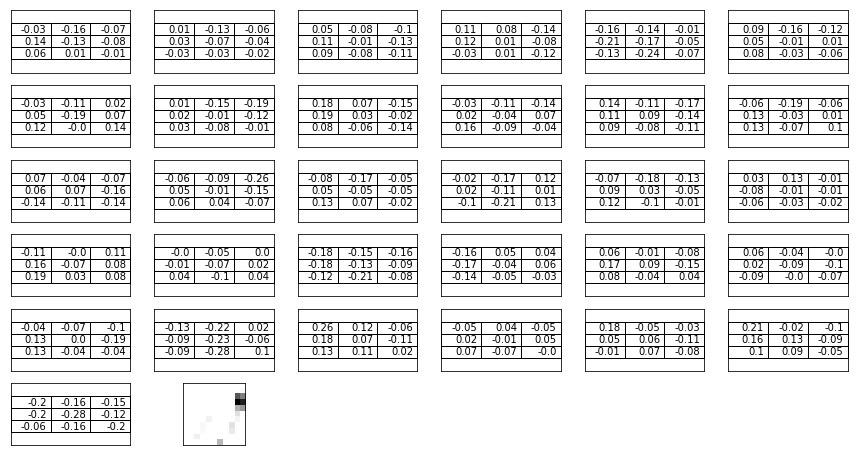

kernel  19 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


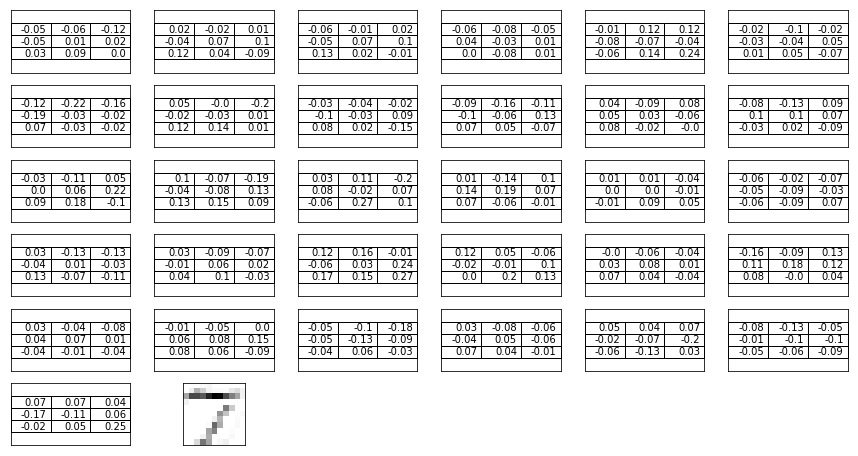

kernel  20 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


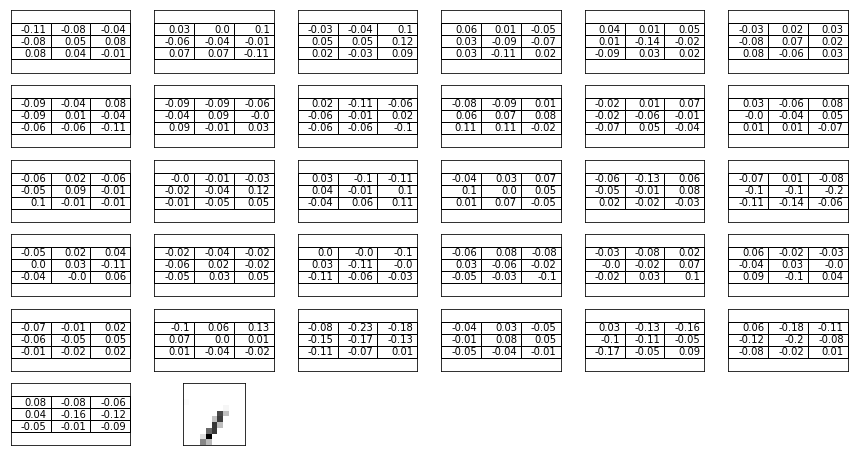

kernel  21 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


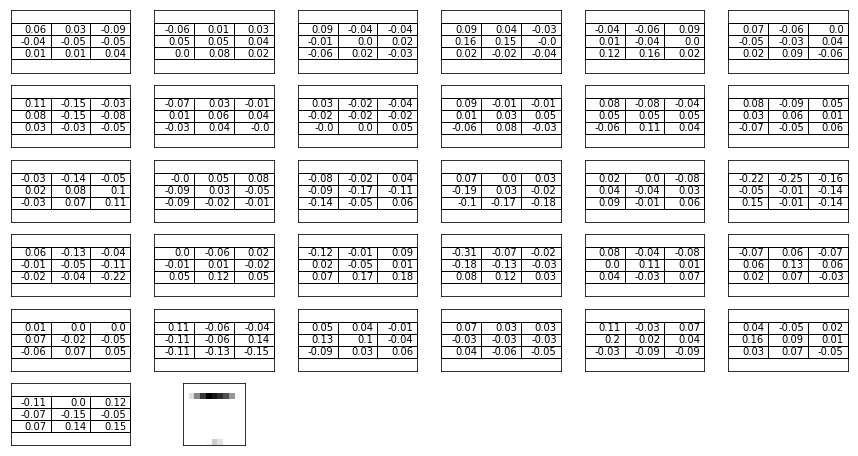

kernel  22 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


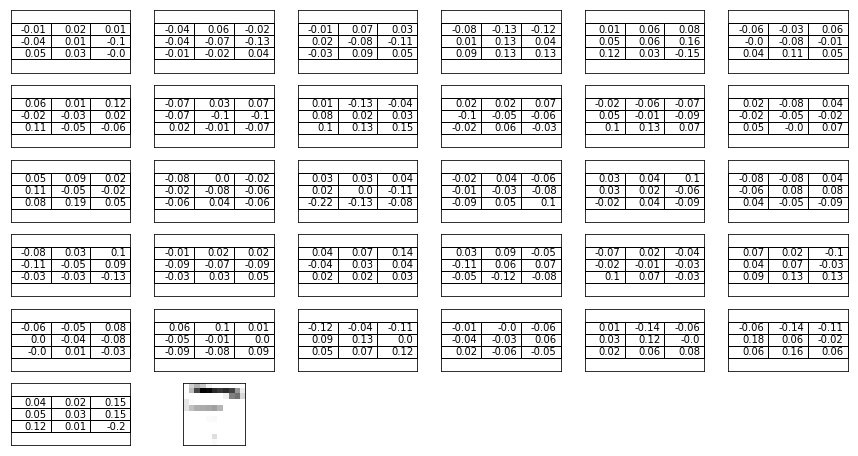

kernel  23 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


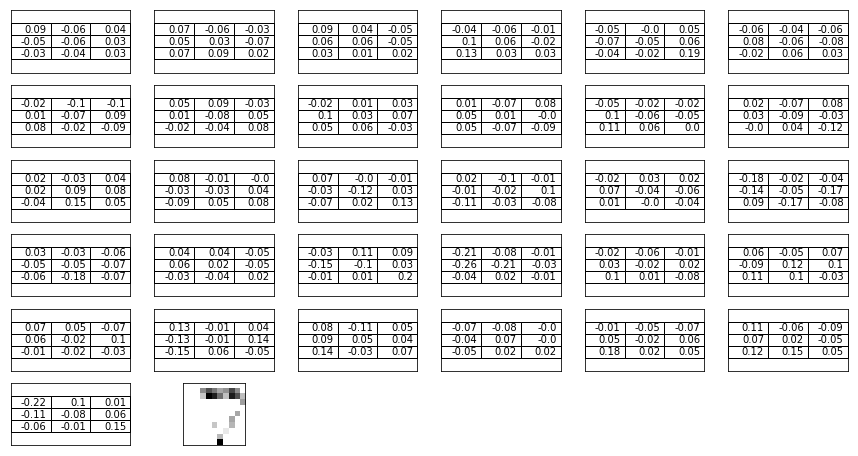

kernel  24 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


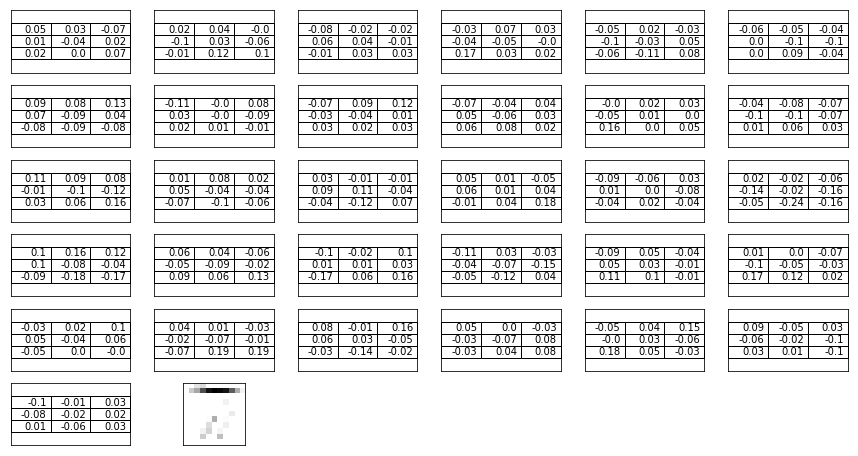

kernel  25 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


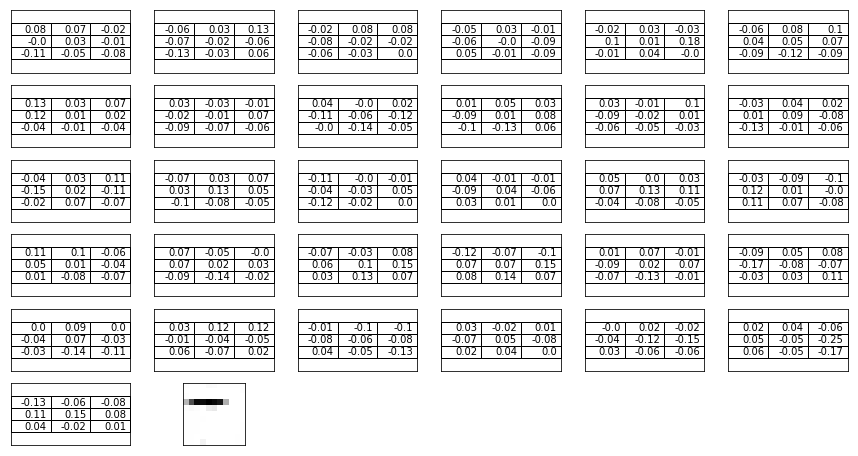

kernel  26 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


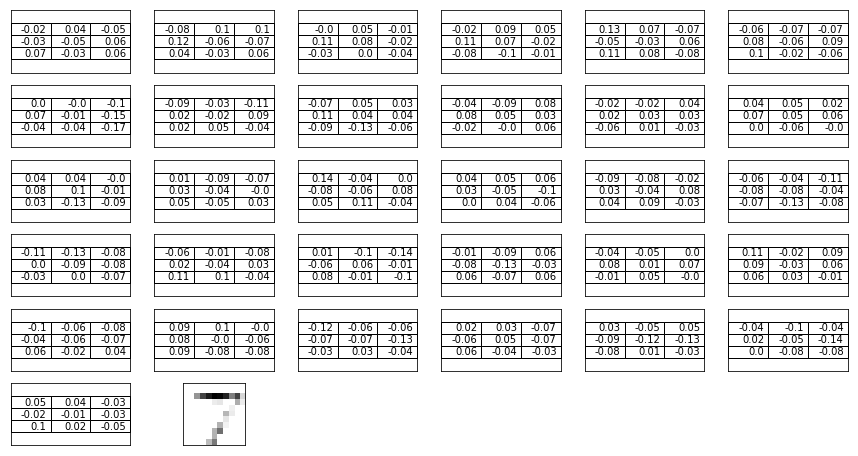

kernel  27 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


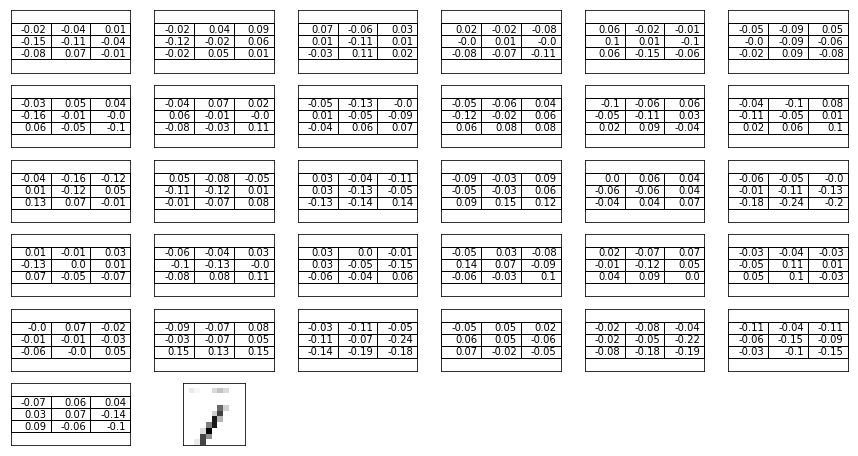

kernel  28 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


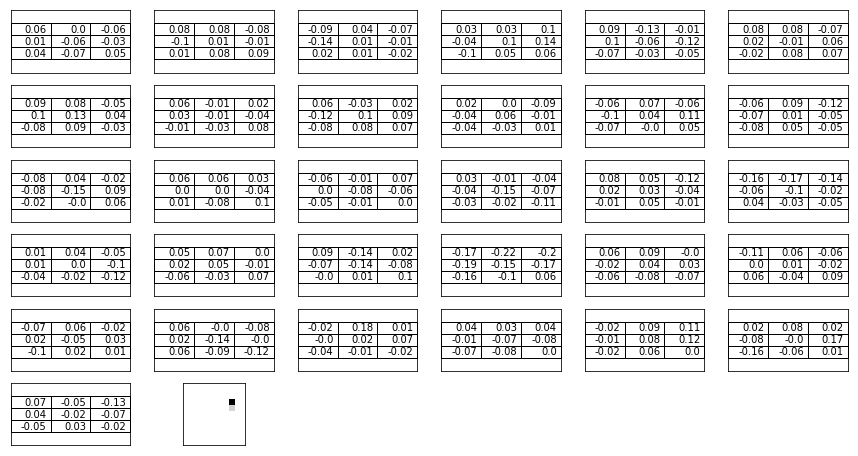

kernel  29 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


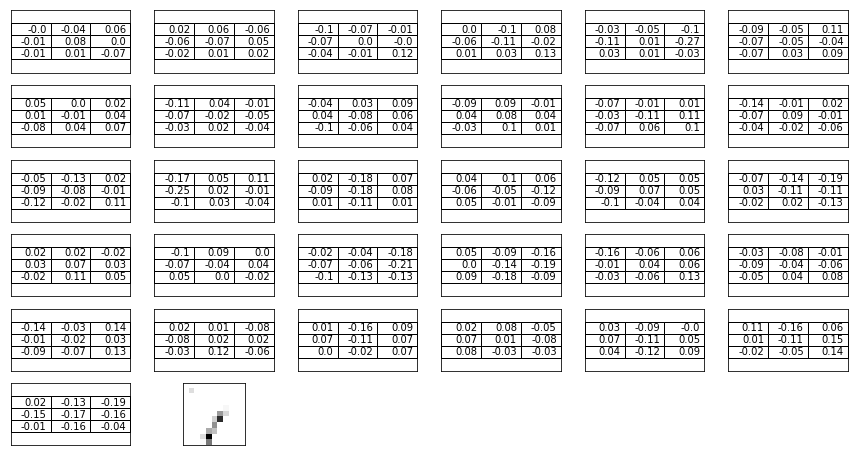

kernel  30 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


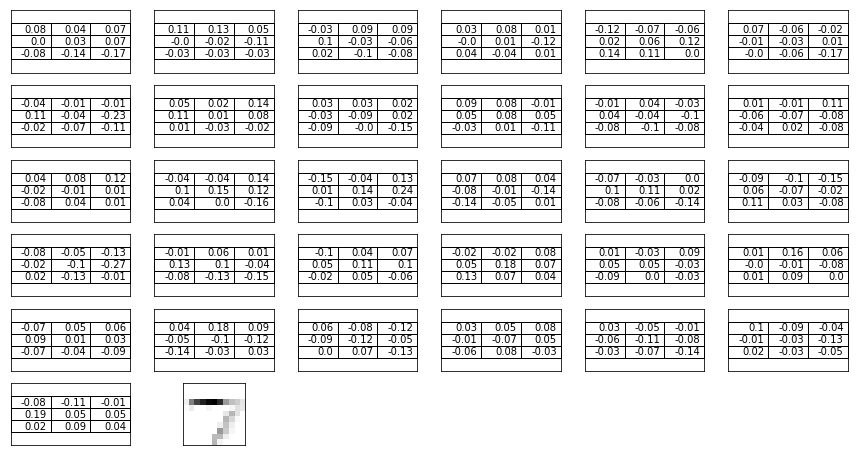

kernel  31 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


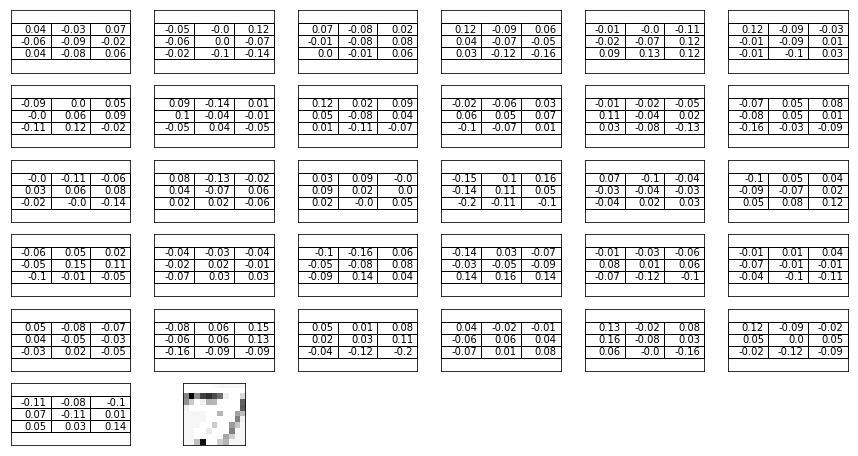

kernel  32 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


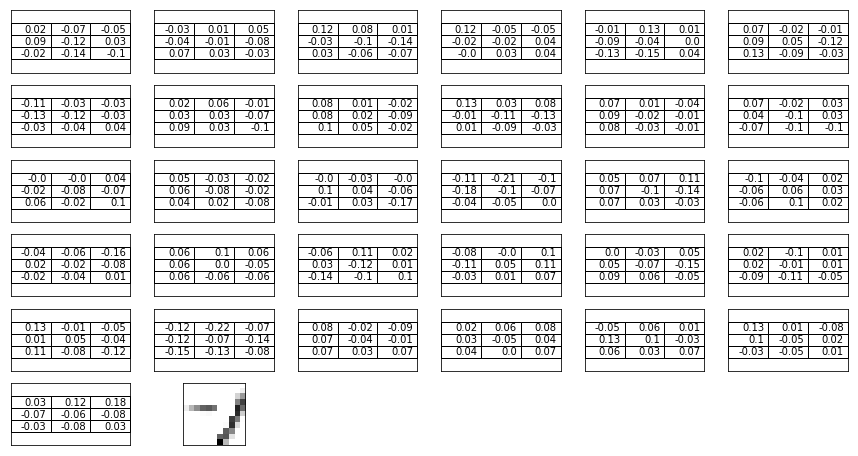

kernel  33 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


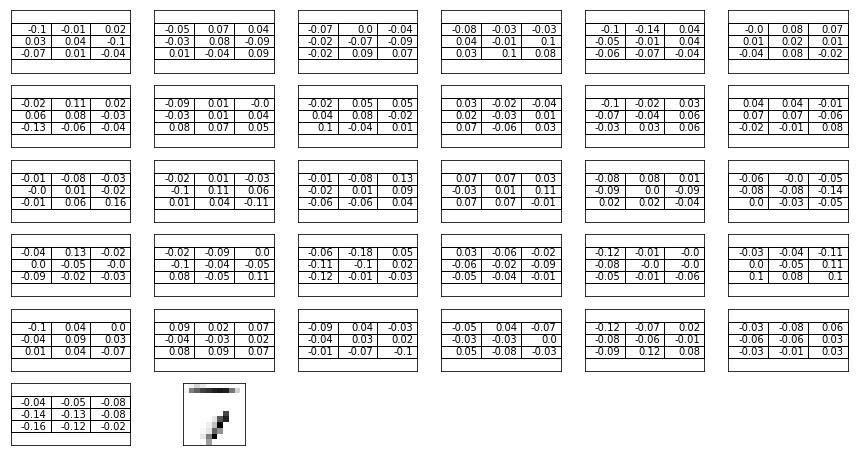

kernel  34 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


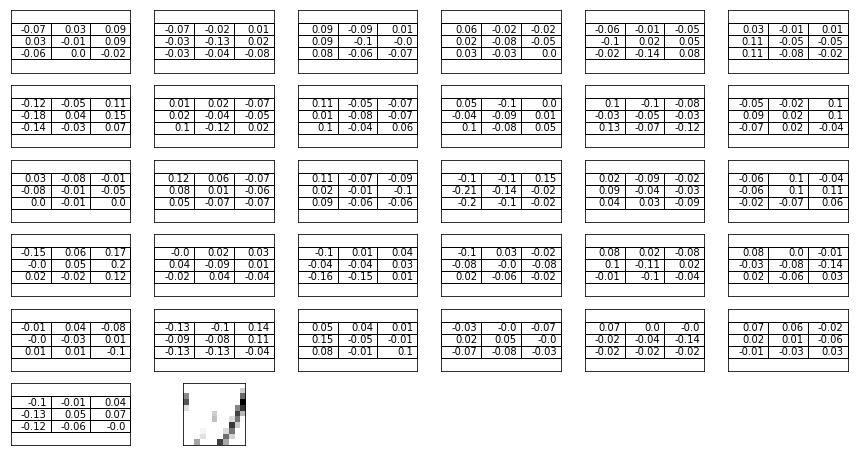

kernel  35 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


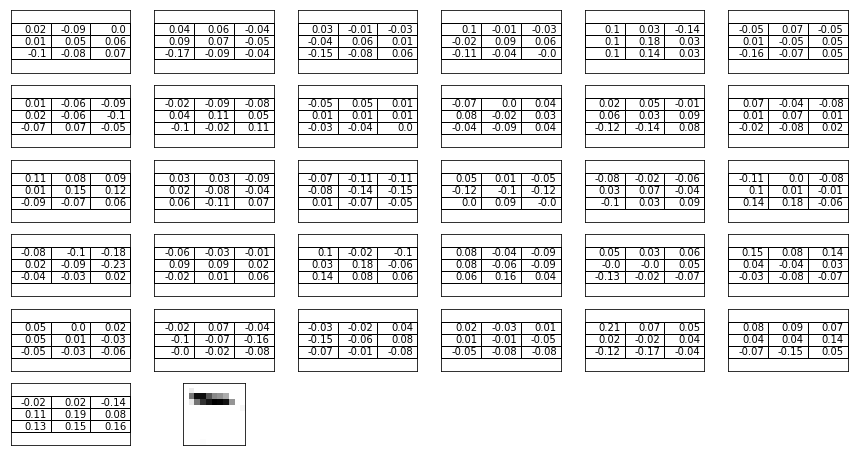

kernel  36 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


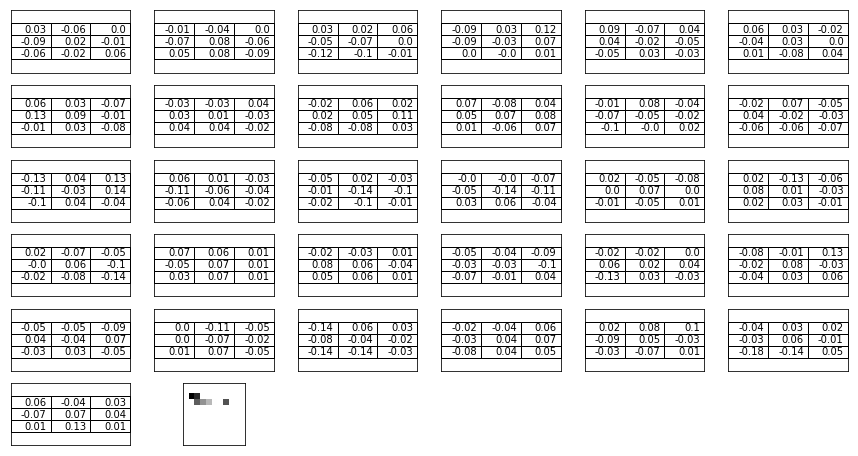

kernel  37 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


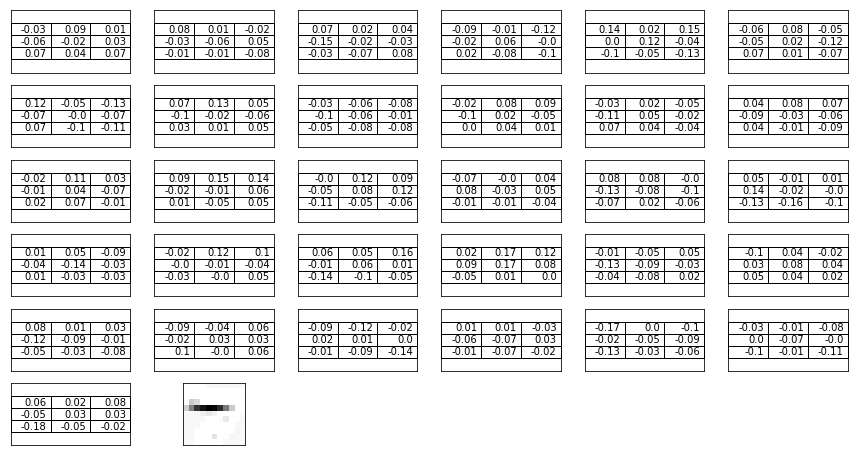

kernel  38 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


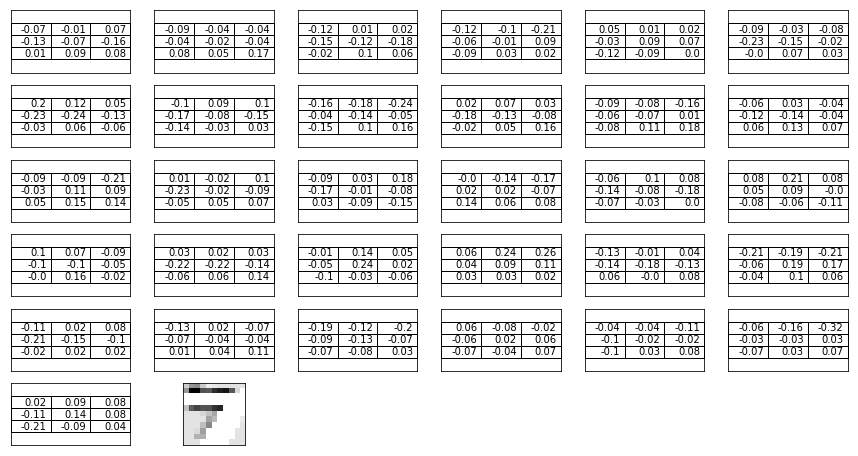

kernel  39 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


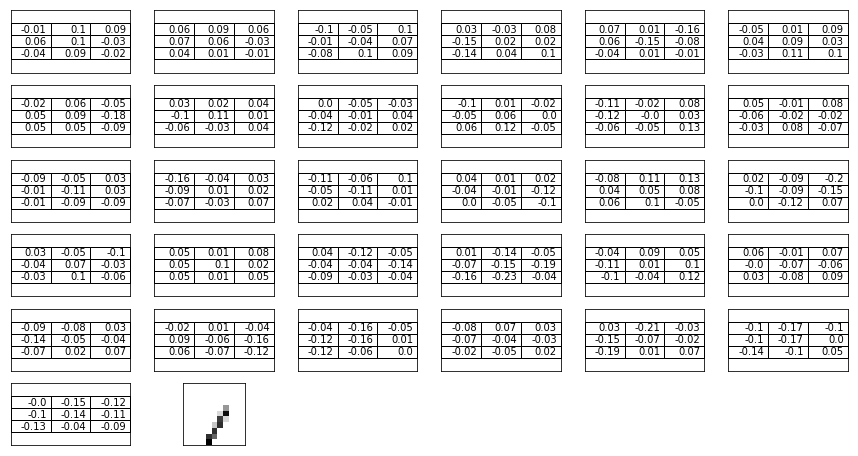

kernel  40 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


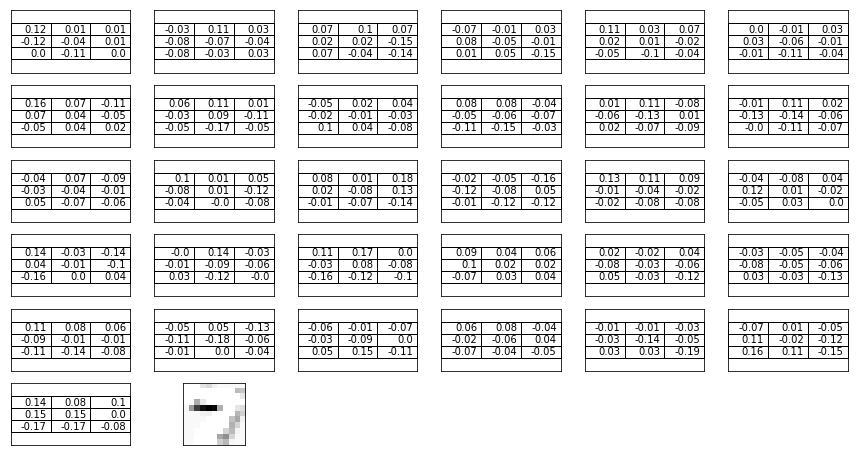

kernel  41 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


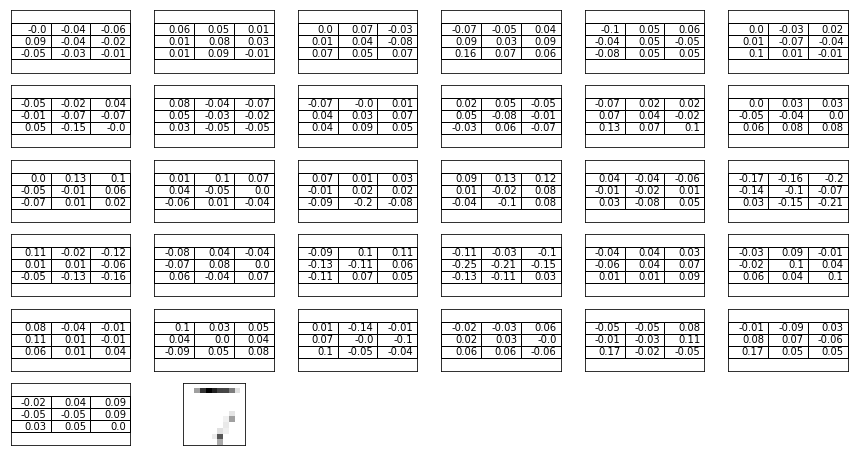

kernel  42 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


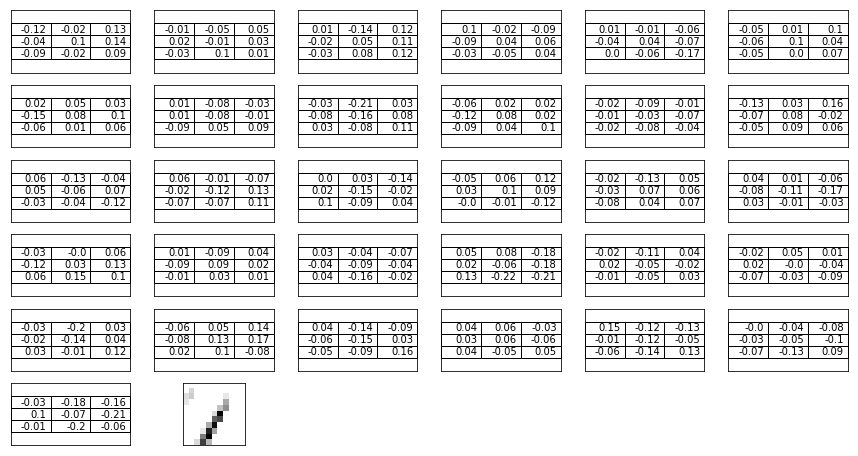

kernel  43 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


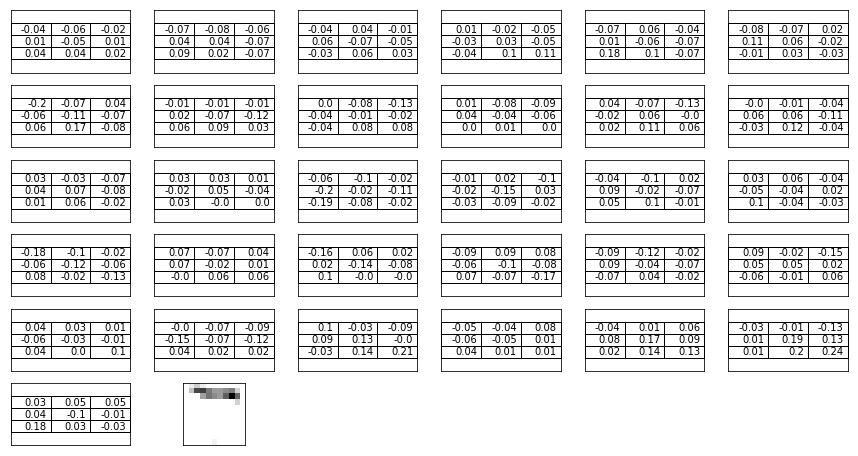

kernel  44 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


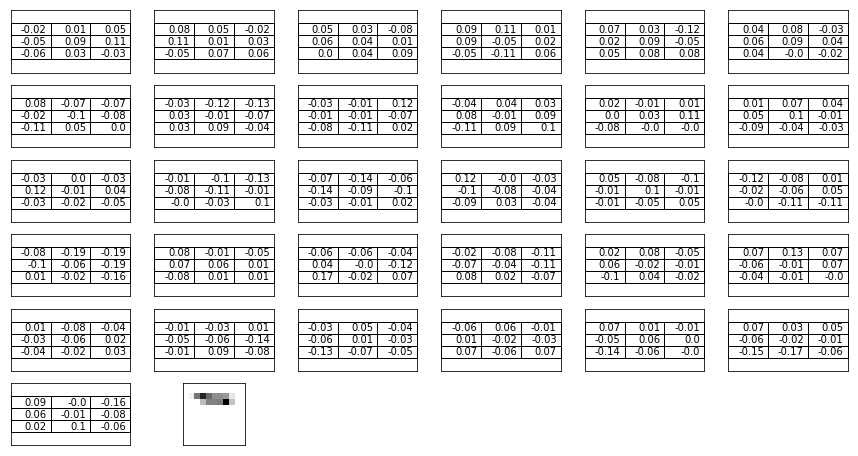

kernel  45 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


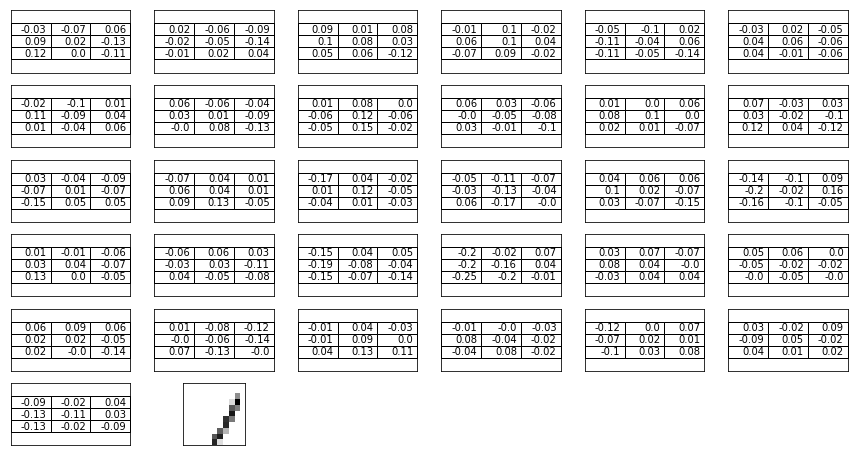

kernel  46 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


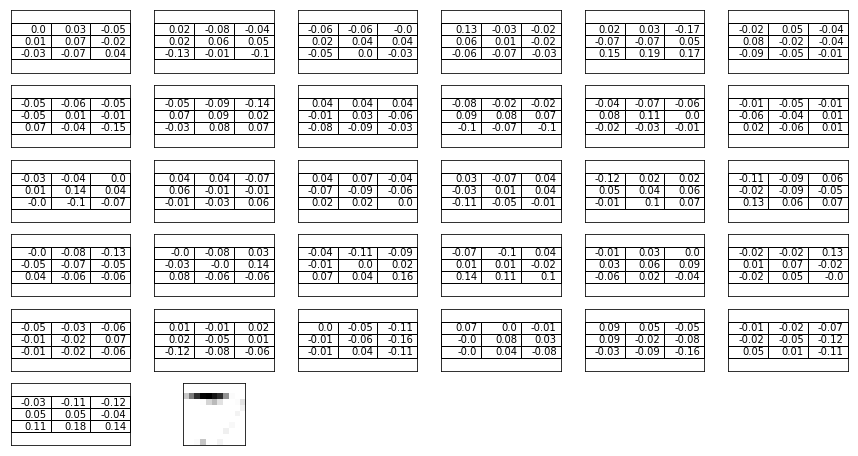

kernel  47 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


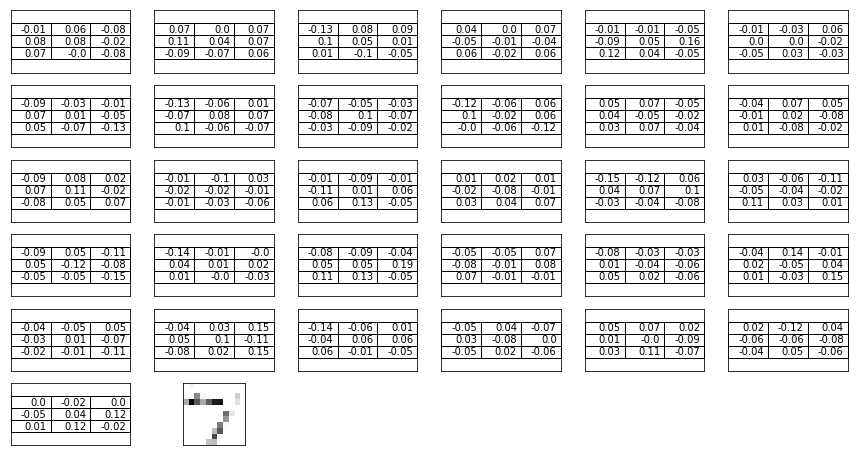

kernel  48 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


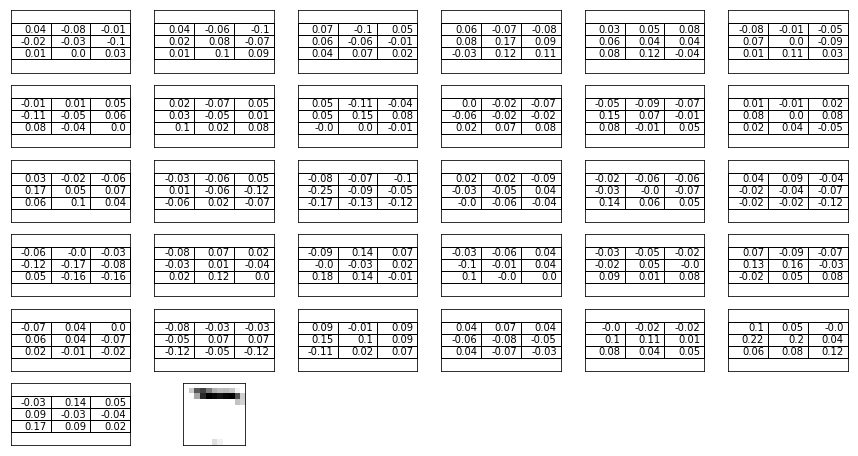

kernel  49 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


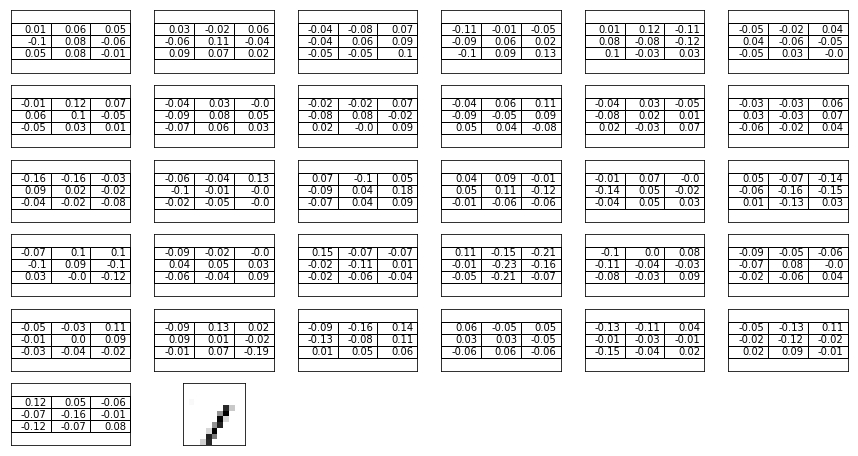

kernel  50 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


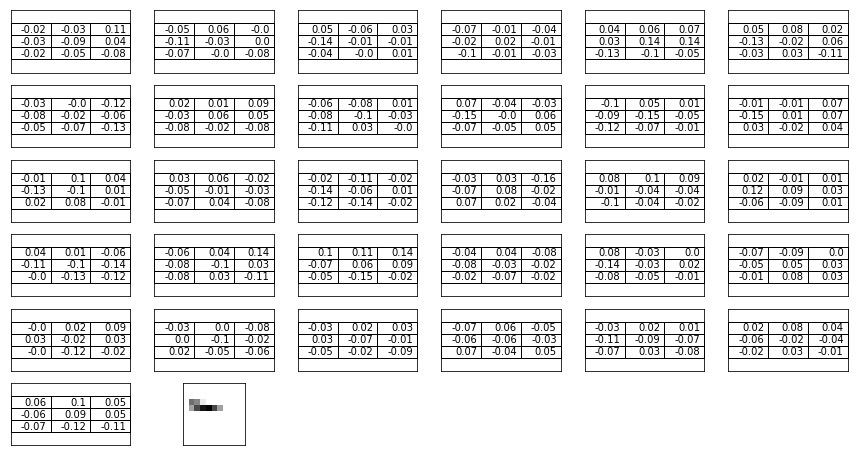

kernel  51 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


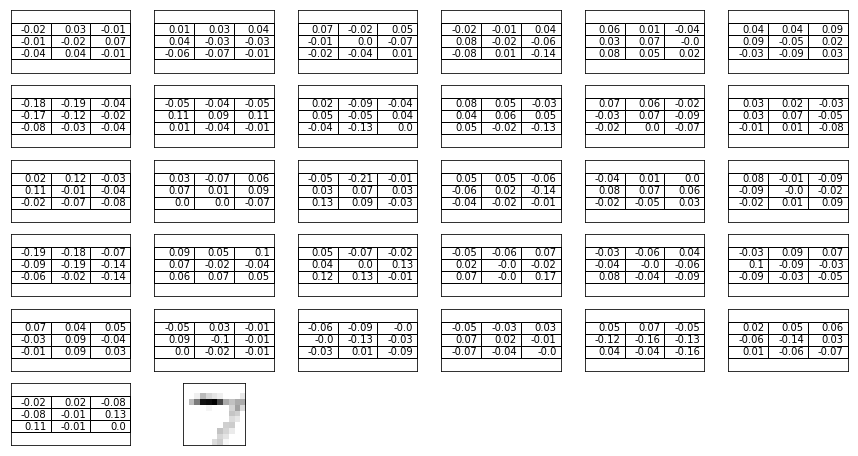

kernel  52 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


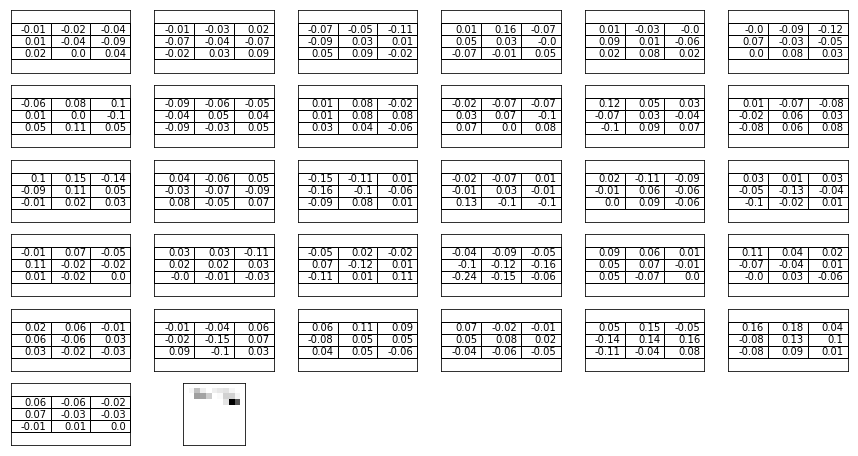

kernel  53 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


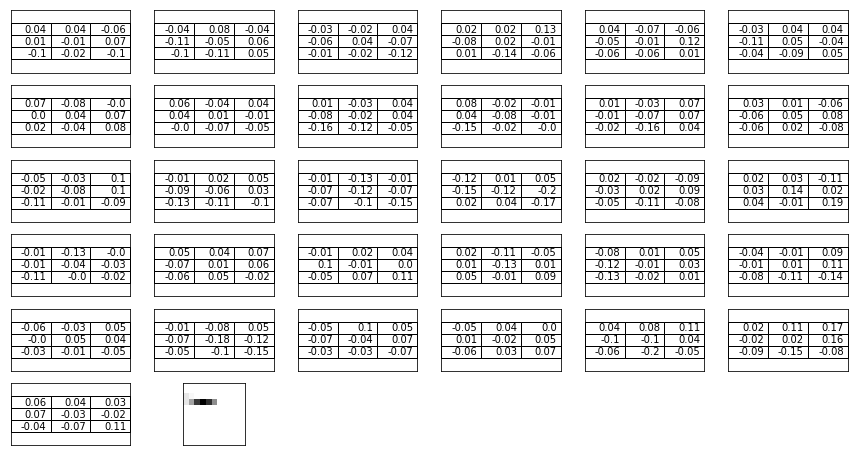

kernel  54 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


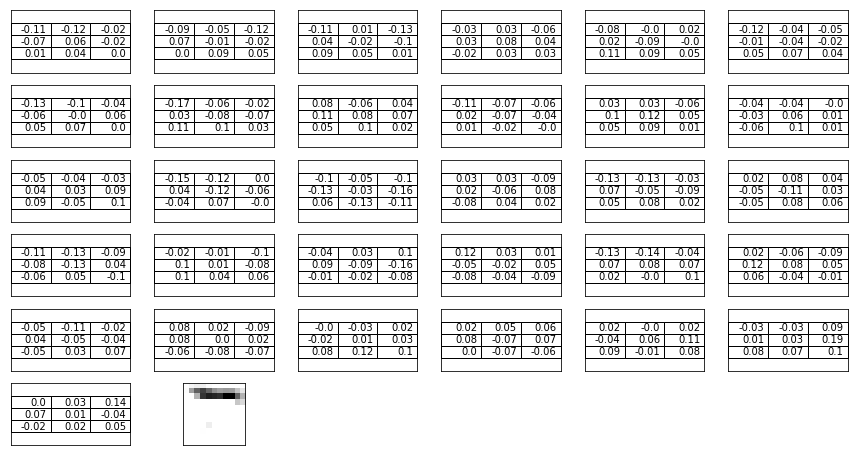

kernel  55 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


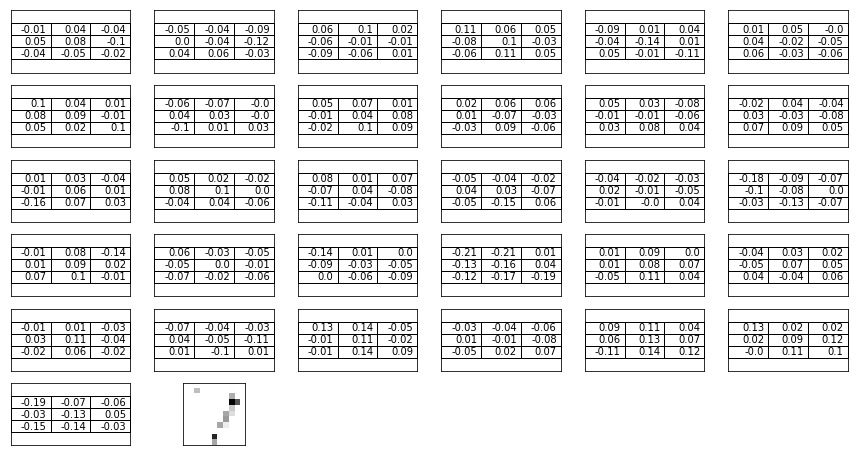

kernel  56 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


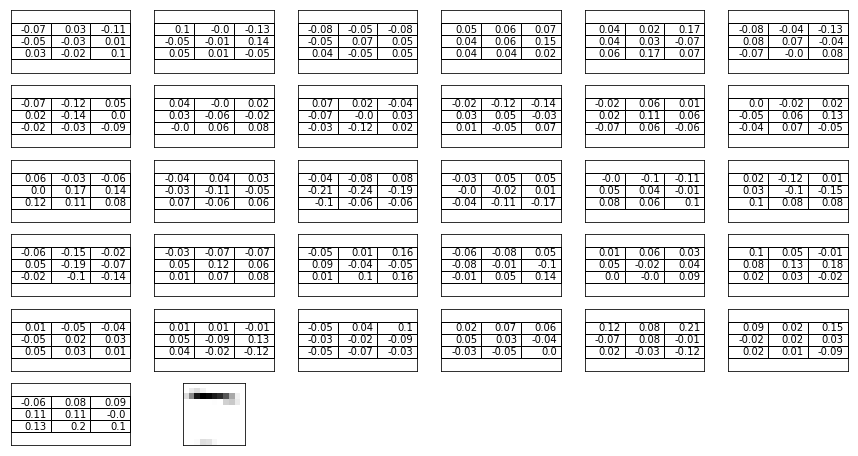

kernel  57 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


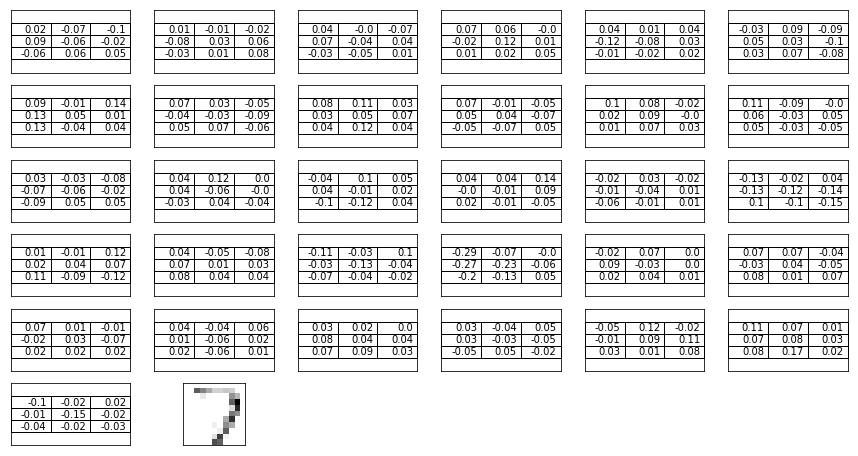

kernel  58 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


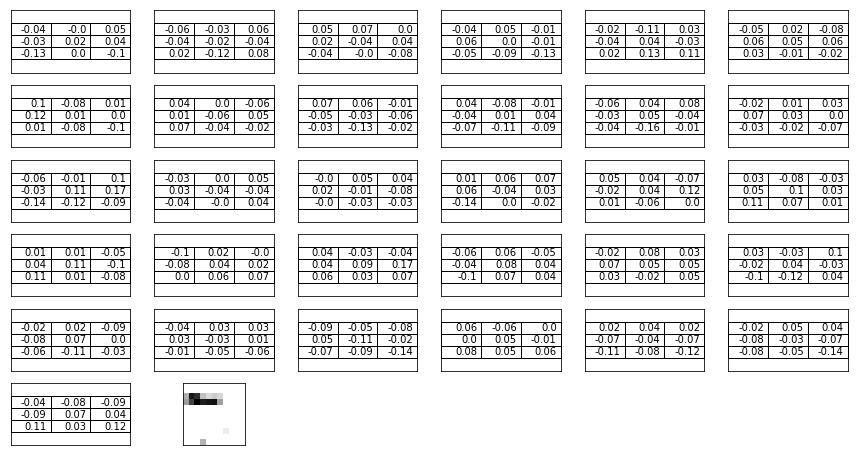

kernel  59 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


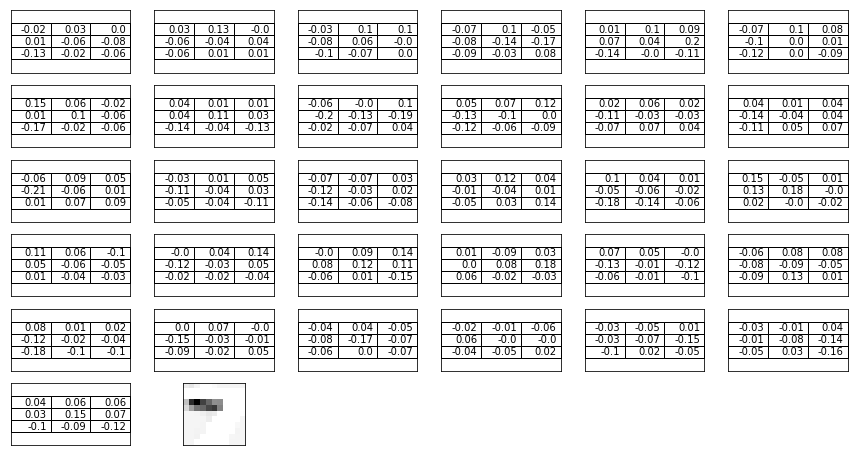

kernel  60 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


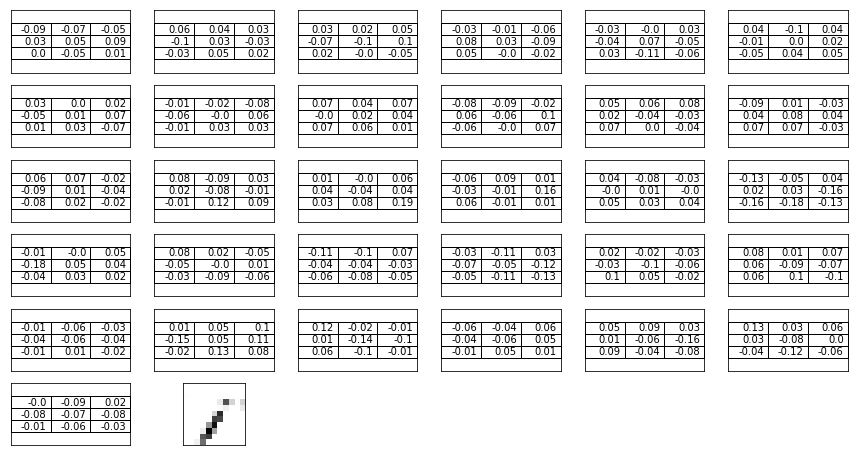

kernel  61 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


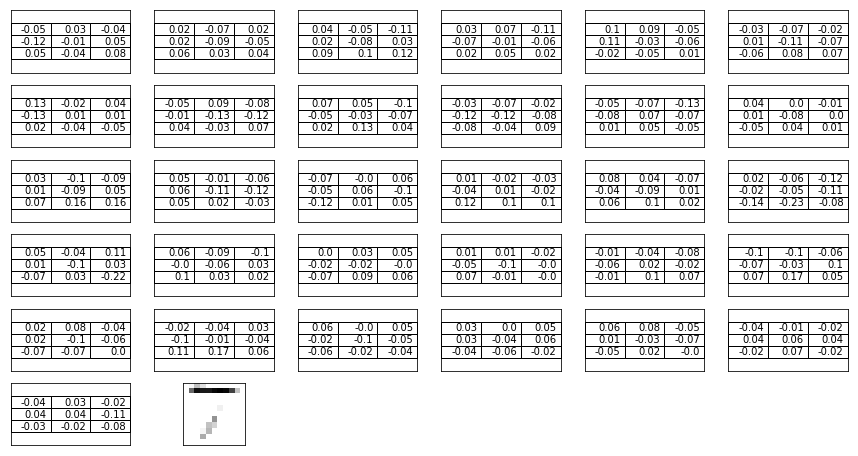

kernel  62 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


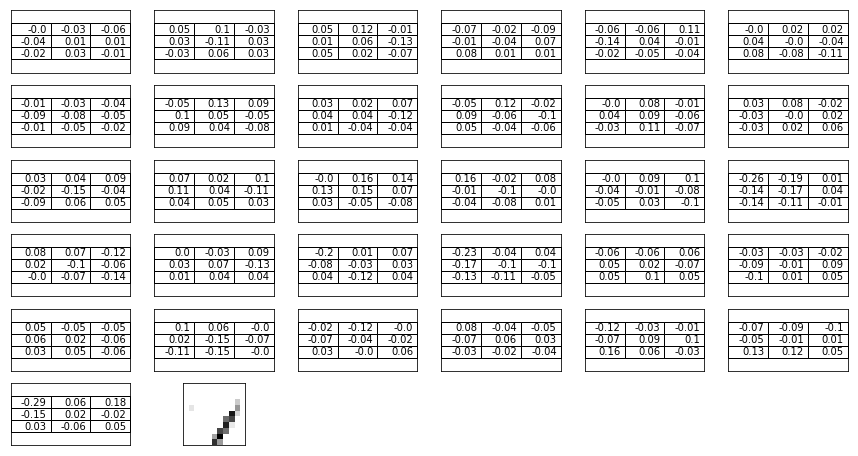

kernel  63 / 64 :  (3, 3, 32)
kernel output:  (1, 11, 11)


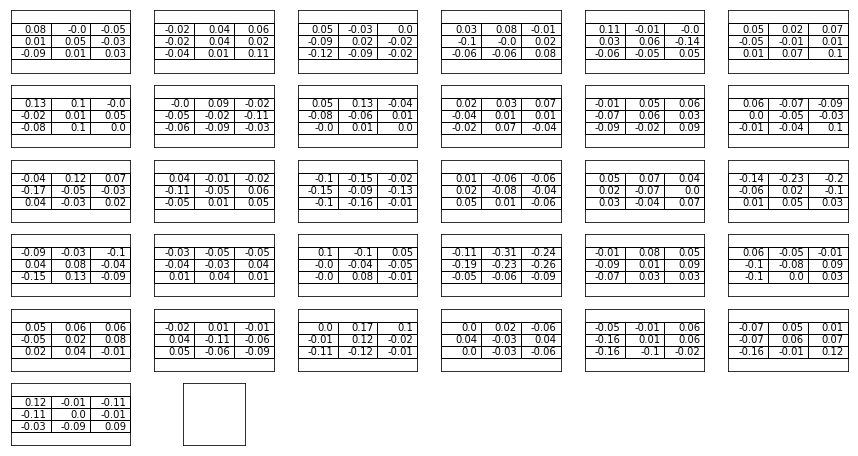

In [144]:
# model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# max_pooling2d_6 (MaxPooling2 (None, 13, 13, 32)        0         
# conv2d_10 (Conv2D)           (None, 11, 11, 64)        18496 

draw_layer(2)

# this layer take img 13*13*32 as input
#  each kernel size: 3*3*32
# kernel count is 64
# output: 11*11*64


layer:  3
input:  Tensor("conv2d_4/Identity:0", shape=(None, 11, 11, 64), dtype=float32)
output:  Tensor("max_pooling2d_3/Identity:0", shape=(None, 5, 5, 64), dtype=float32)
output shape:  (1, 5, 5, 64)
pooling:  (2, 2)
pooling  0 :  (1, 5, 5)


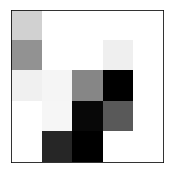

pooling  1 :  (1, 5, 5)


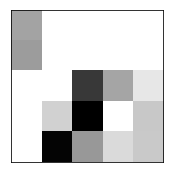

pooling  2 :  (1, 5, 5)


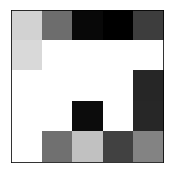

pooling  3 :  (1, 5, 5)


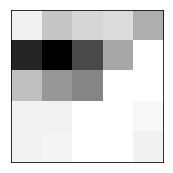

pooling  4 :  (1, 5, 5)


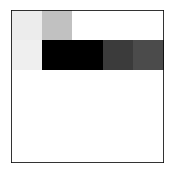

pooling  5 :  (1, 5, 5)


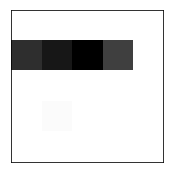

pooling  6 :  (1, 5, 5)


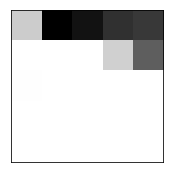

pooling  7 :  (1, 5, 5)


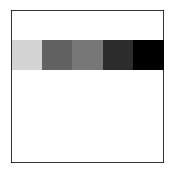

pooling  8 :  (1, 5, 5)


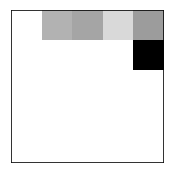

pooling  9 :  (1, 5, 5)


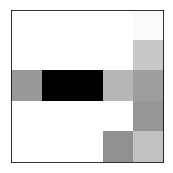

pooling  10 :  (1, 5, 5)


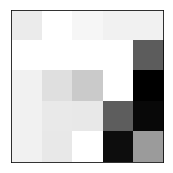

pooling  11 :  (1, 5, 5)


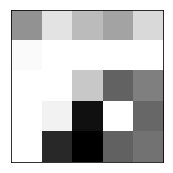

pooling  12 :  (1, 5, 5)


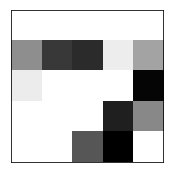

pooling  13 :  (1, 5, 5)


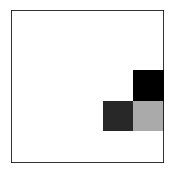

pooling  14 :  (1, 5, 5)


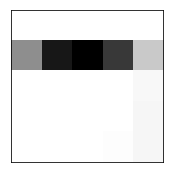

pooling  15 :  (1, 5, 5)


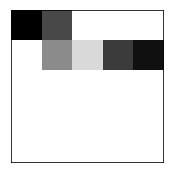

pooling  16 :  (1, 5, 5)


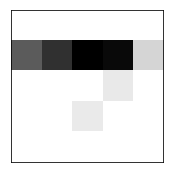

pooling  17 :  (1, 5, 5)


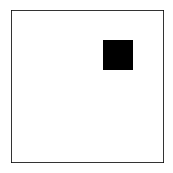

pooling  18 :  (1, 5, 5)


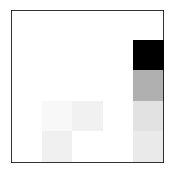

pooling  19 :  (1, 5, 5)


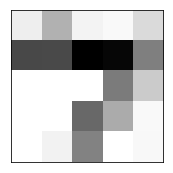

pooling  20 :  (1, 5, 5)


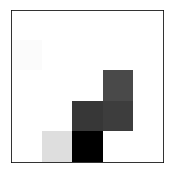

pooling  21 :  (1, 5, 5)


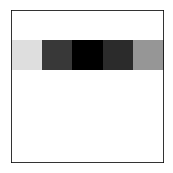

pooling  22 :  (1, 5, 5)


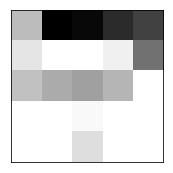

pooling  23 :  (1, 5, 5)


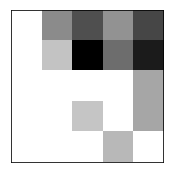

pooling  24 :  (1, 5, 5)


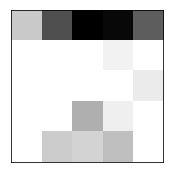

pooling  25 :  (1, 5, 5)


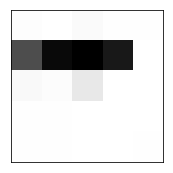

pooling  26 :  (1, 5, 5)


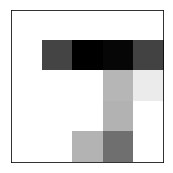

pooling  27 :  (1, 5, 5)


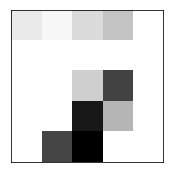

pooling  28 :  (1, 5, 5)


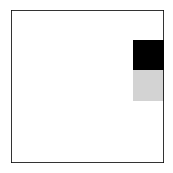

pooling  29 :  (1, 5, 5)


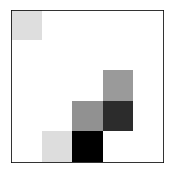

pooling  30 :  (1, 5, 5)


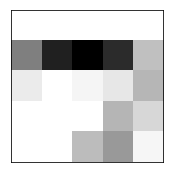

pooling  31 :  (1, 5, 5)


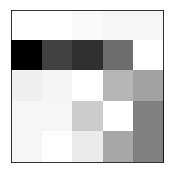

pooling  32 :  (1, 5, 5)


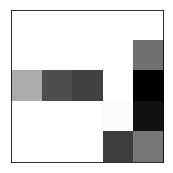

pooling  33 :  (1, 5, 5)


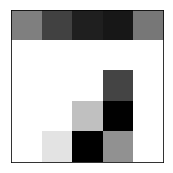

pooling  34 :  (1, 5, 5)


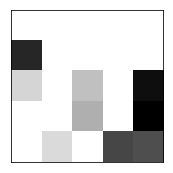

pooling  35 :  (1, 5, 5)


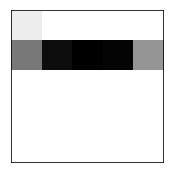

pooling  36 :  (1, 5, 5)


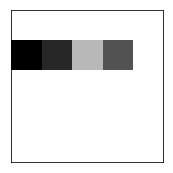

pooling  37 :  (1, 5, 5)


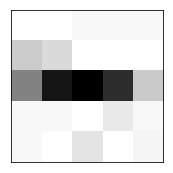

pooling  38 :  (1, 5, 5)


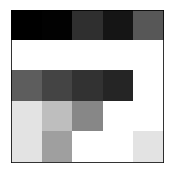

pooling  39 :  (1, 5, 5)


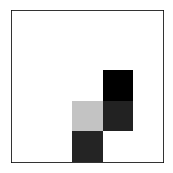

pooling  40 :  (1, 5, 5)


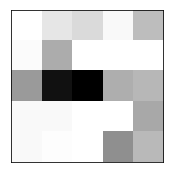

pooling  41 :  (1, 5, 5)


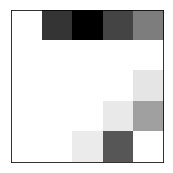

pooling  42 :  (1, 5, 5)


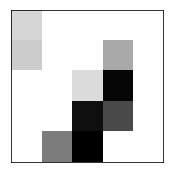

pooling  43 :  (1, 5, 5)


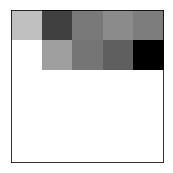

pooling  44 :  (1, 5, 5)


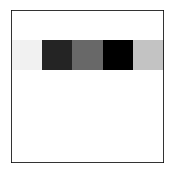

pooling  45 :  (1, 5, 5)


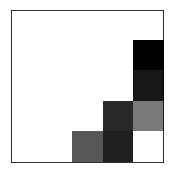

pooling  46 :  (1, 5, 5)


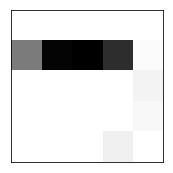

pooling  47 :  (1, 5, 5)


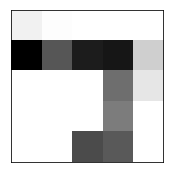

pooling  48 :  (1, 5, 5)


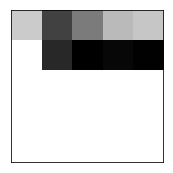

pooling  49 :  (1, 5, 5)


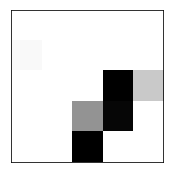

pooling  50 :  (1, 5, 5)


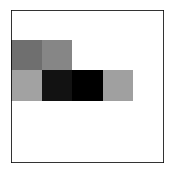

pooling  51 :  (1, 5, 5)


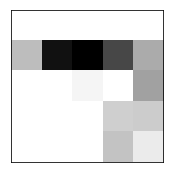

pooling  52 :  (1, 5, 5)


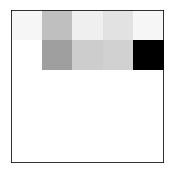

pooling  53 :  (1, 5, 5)


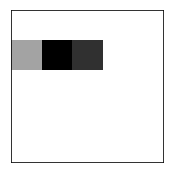

pooling  54 :  (1, 5, 5)


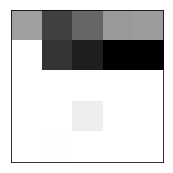

pooling  55 :  (1, 5, 5)


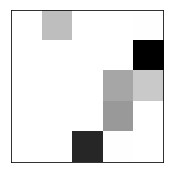

pooling  56 :  (1, 5, 5)


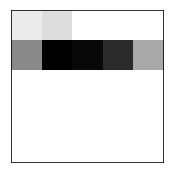

pooling  57 :  (1, 5, 5)


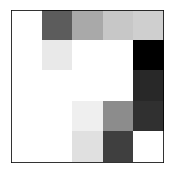

pooling  58 :  (1, 5, 5)


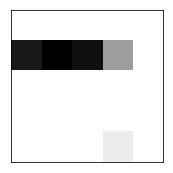

pooling  59 :  (1, 5, 5)


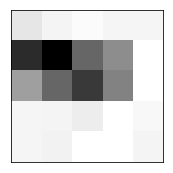

pooling  60 :  (1, 5, 5)


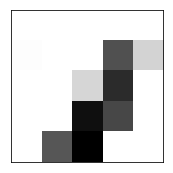

pooling  61 :  (1, 5, 5)


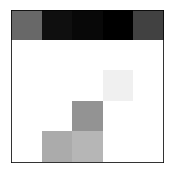

pooling  62 :  (1, 5, 5)


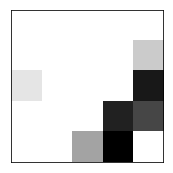

pooling  63 :  (1, 5, 5)


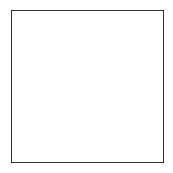

In [125]:
# model.add(layers.MaxPooling2D((2, 2)))
draw_layer(3)

layer:  4
input:  Tensor("max_pooling2d_3/Identity:0", shape=(None, 5, 5, 64), dtype=float32)
output:  Tensor("conv2d_5/Identity:0", shape=(None, 3, 3, 64), dtype=float32)
output shape:  (1, 3, 3, 64)
bias:  <tf.Variable 'conv2d_5/bias:0' shape=(64,) dtype=float32, numpy=
array([-0.0145 , -0.00271,  0.01525, -0.00199,  0.02616, -0.01107,
        0.01589, -0.01678,  0.02674,  0.00633,  0.01813,  0.00937,
       -0.00221, -0.00292,  0.0002 , -0.00226, -0.01417,  0.02893,
        0.00085,  0.00273, -0.00073,  0.01023,  0.01319,  0.03776,
       -0.00393,  0.0024 ,  0.00623,  0.0023 ,  0.02218, -0.01069,
       -0.01619,  0.00931, -0.00752,  0.01003,  0.01186,  0.01157,
        0.00851,  0.00689, -0.02076,  0.0064 ,  0.00128, -0.01161,
        0.01374, -0.01   ,  0.00218, -0.01268,  0.00299,  0.00535,
        0.00287,  0.00057,  0.00237,  0.00551, -0.00433, -0.00553,
       -0.02251,  0.00119, -0.00695, -0.0086 ,  0.00871,  0.01356,
        0.00695, -0.00023,  0.01966,  0.01733], dtype=flo

/home/xuemingl/.local/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


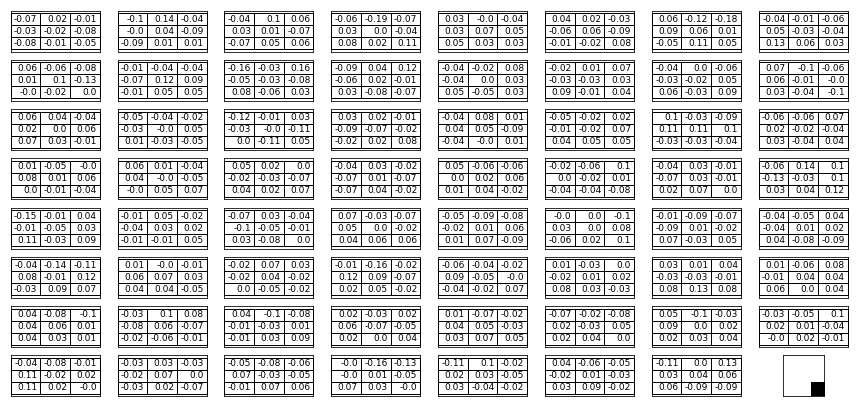

kernel  1 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


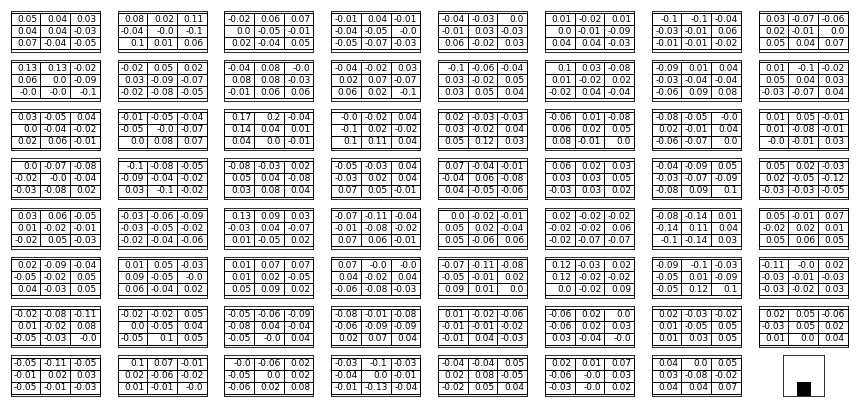

kernel  2 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


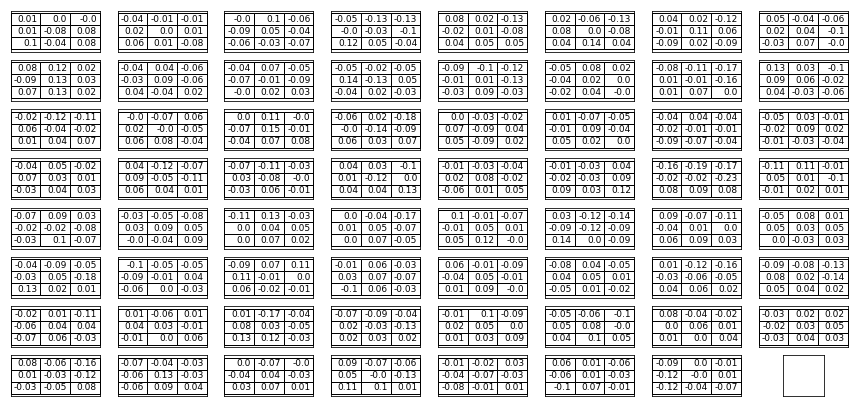

kernel  3 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


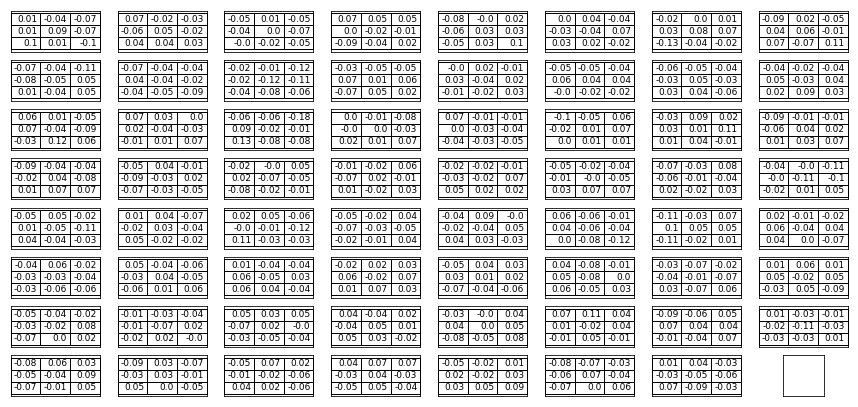

kernel  4 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


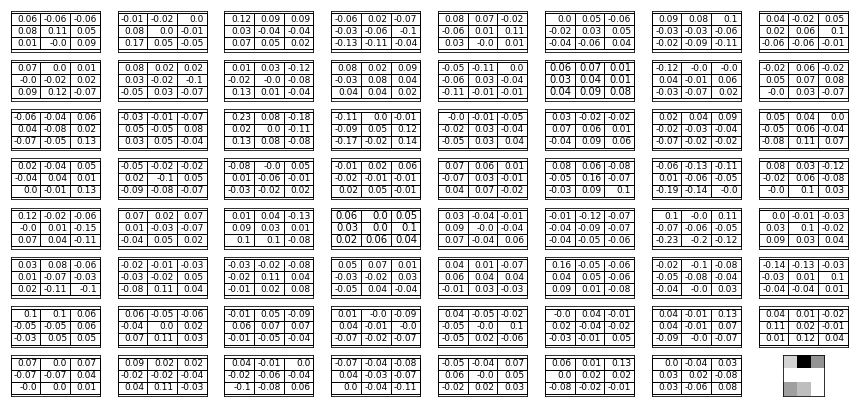

kernel  5 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


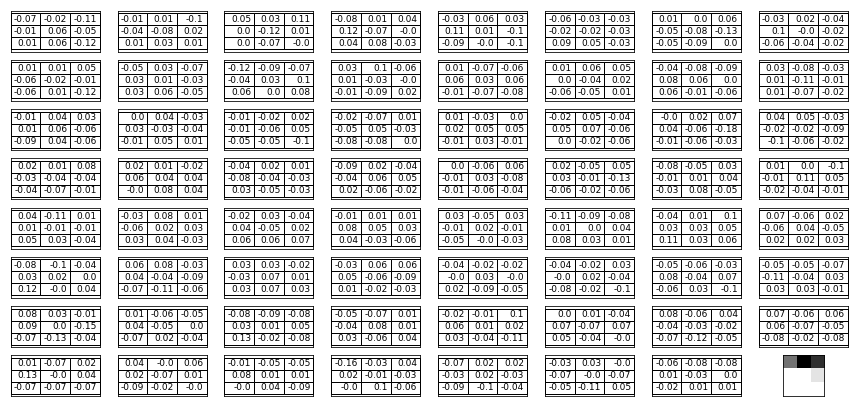

kernel  6 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


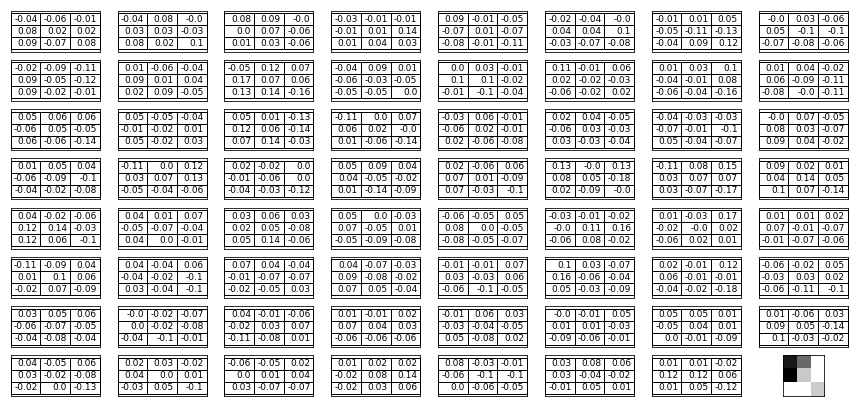

kernel  7 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


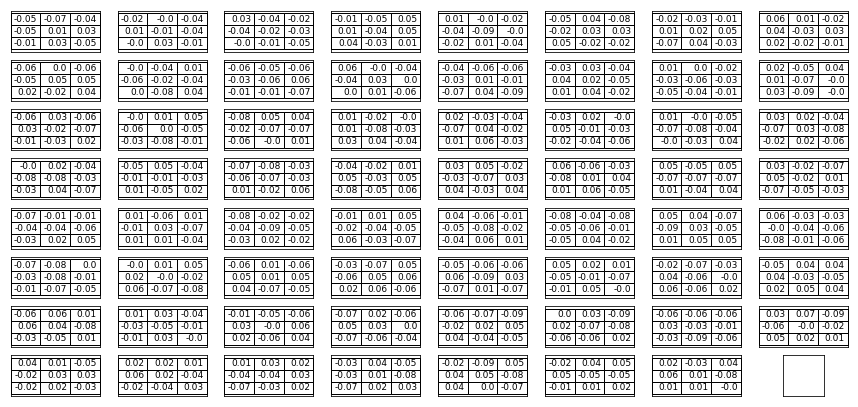

kernel  8 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


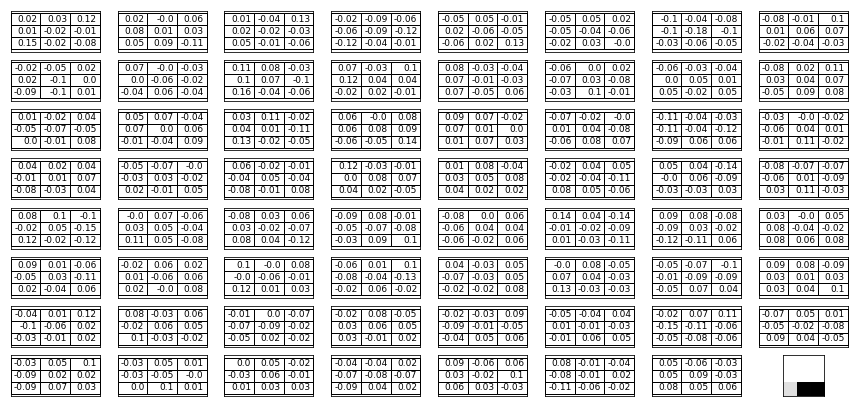

kernel  9 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


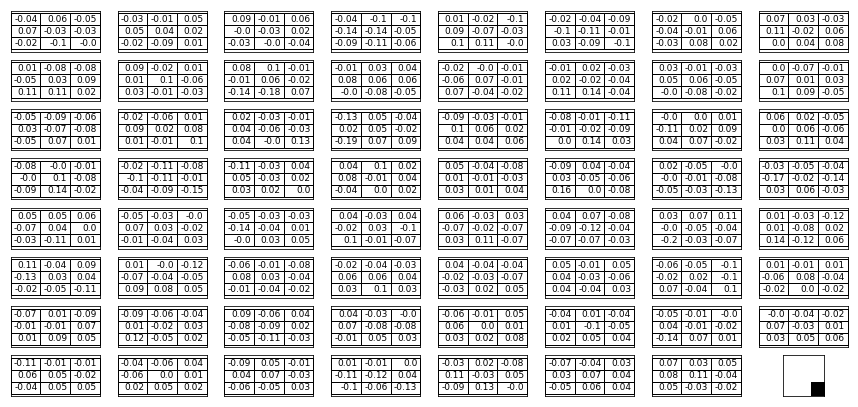

kernel  10 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


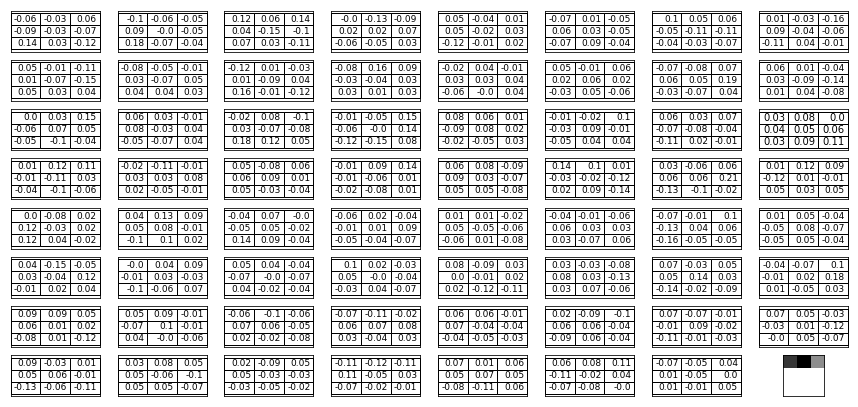

kernel  11 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


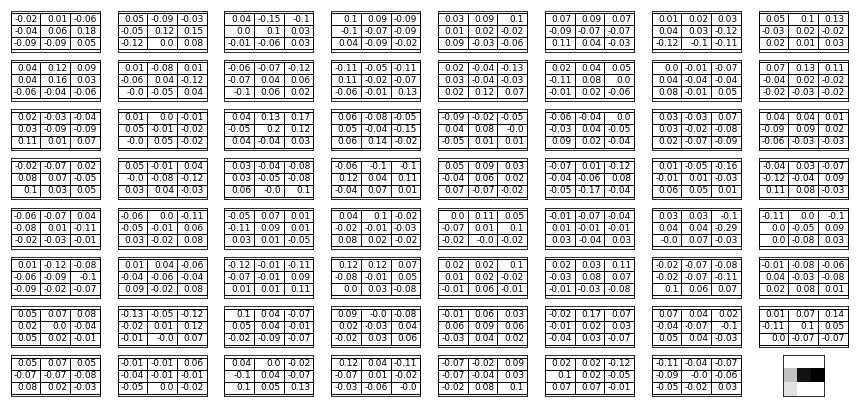

kernel  12 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


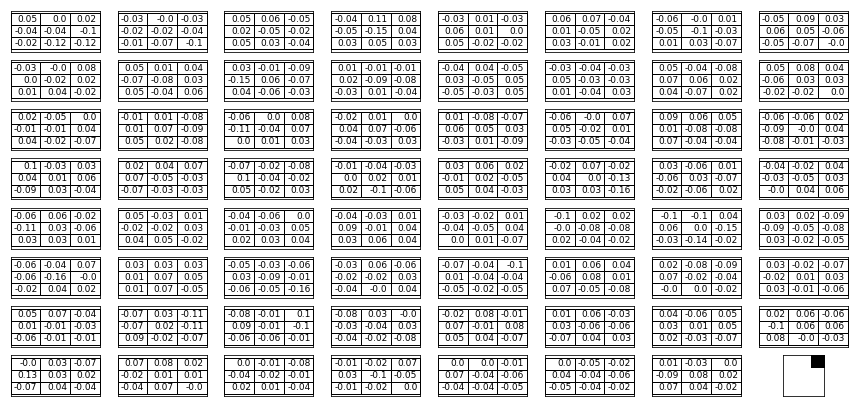

kernel  13 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


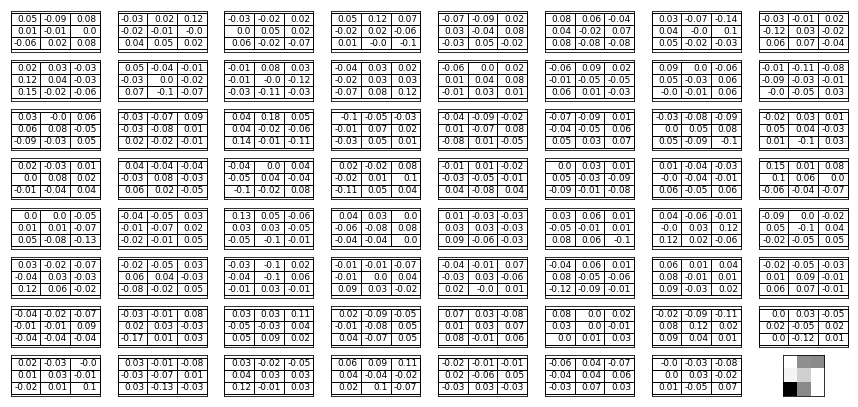

kernel  14 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


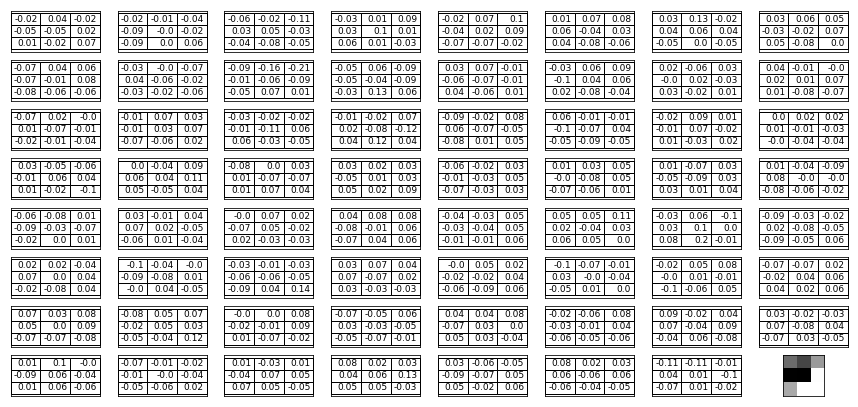

kernel  15 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


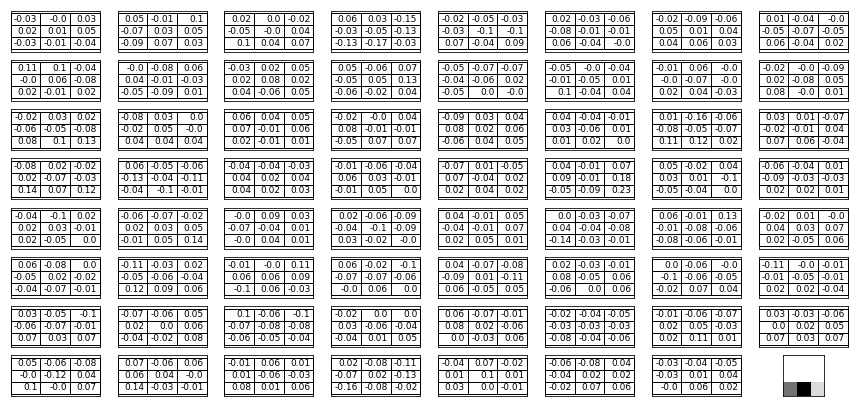

kernel  16 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


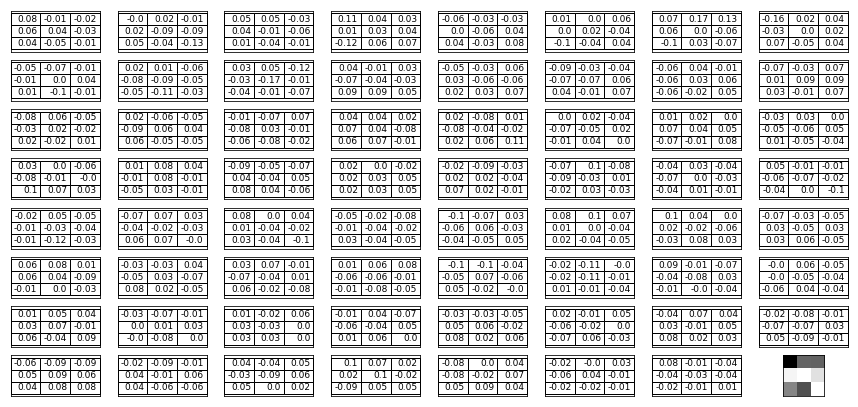

kernel  17 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


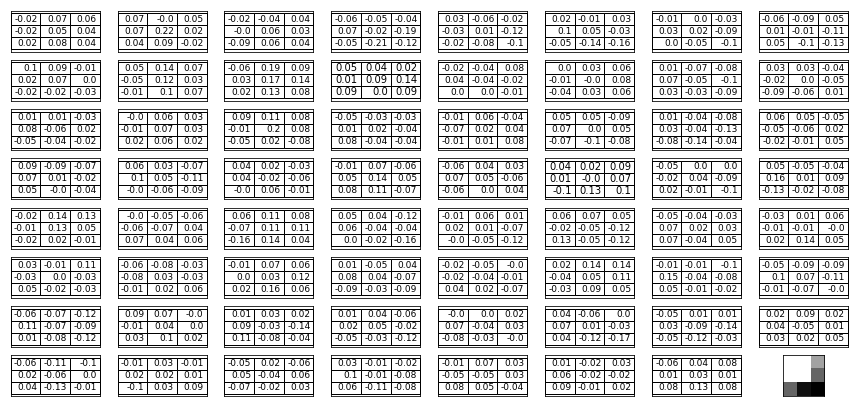

kernel  18 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


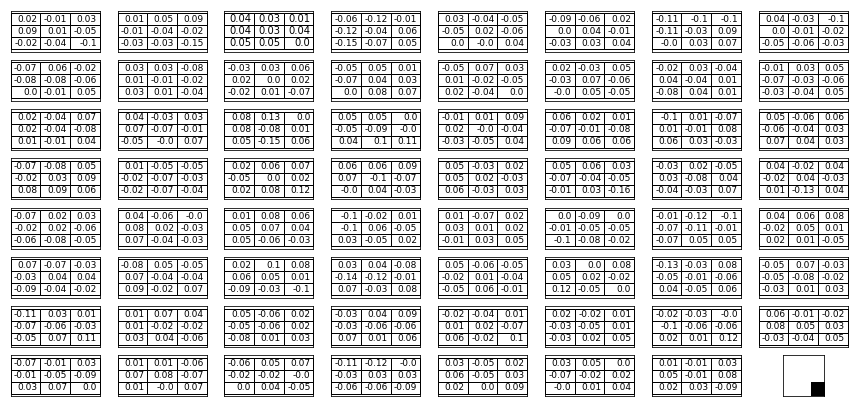

kernel  19 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


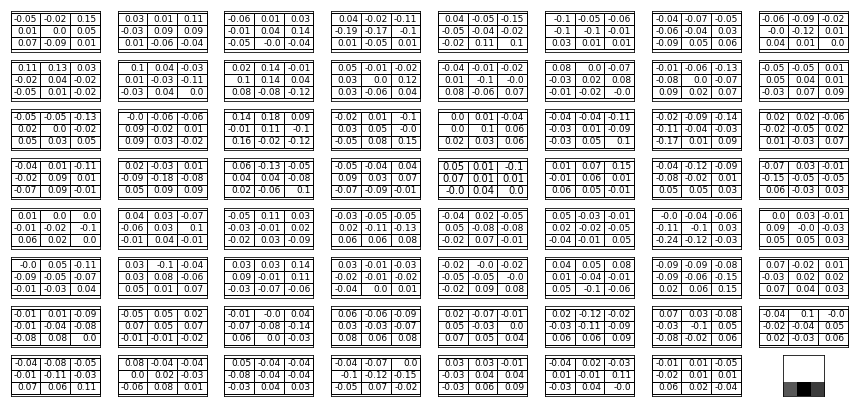

kernel  20 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


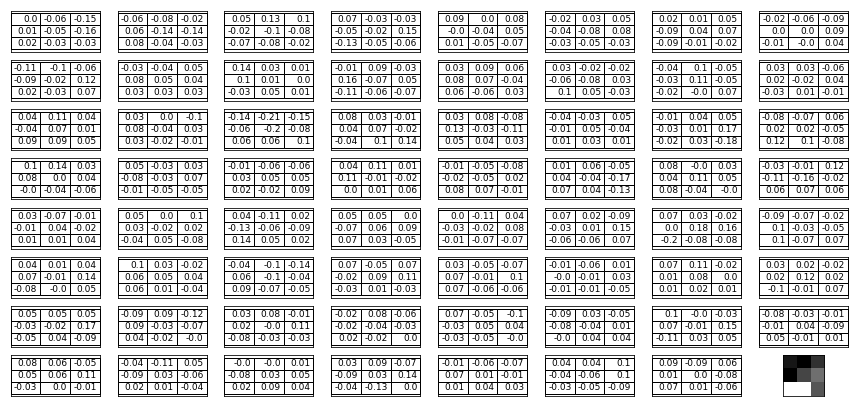

kernel  21 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


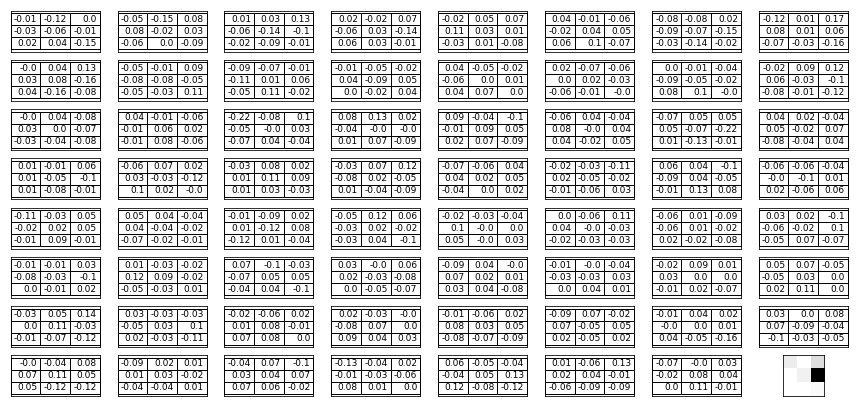

kernel  22 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


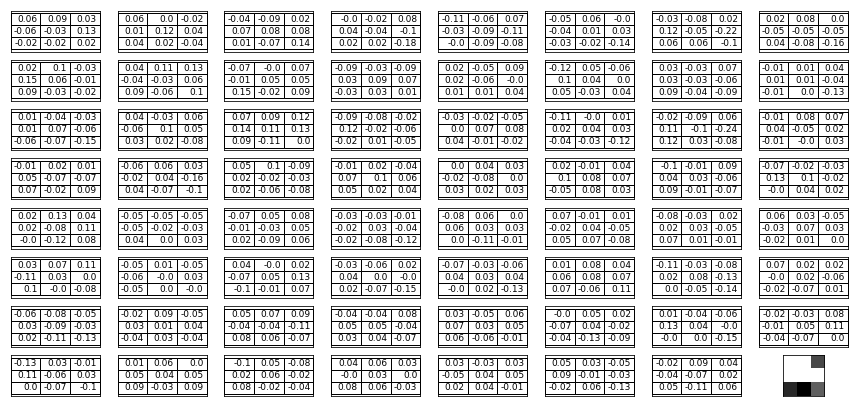

kernel  23 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


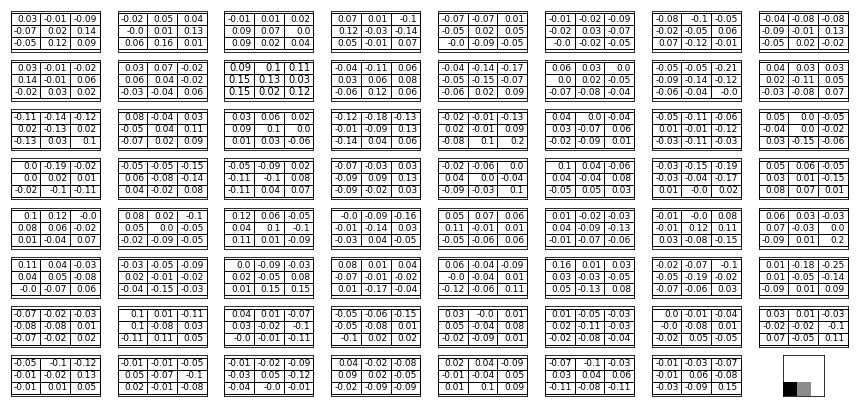

kernel  24 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


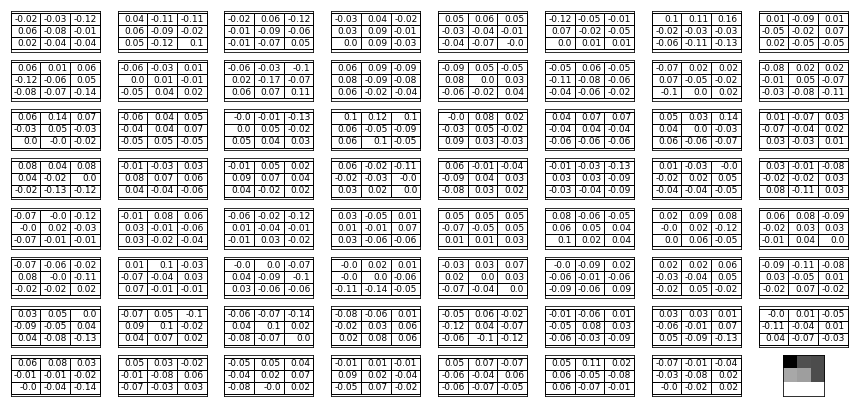

kernel  25 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


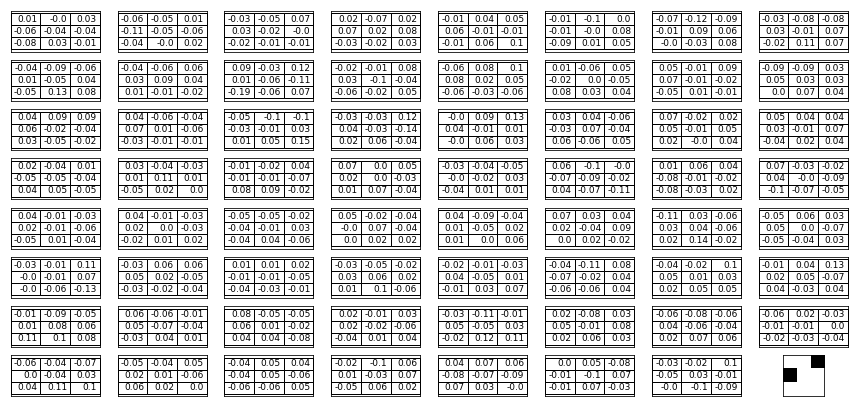

kernel  26 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


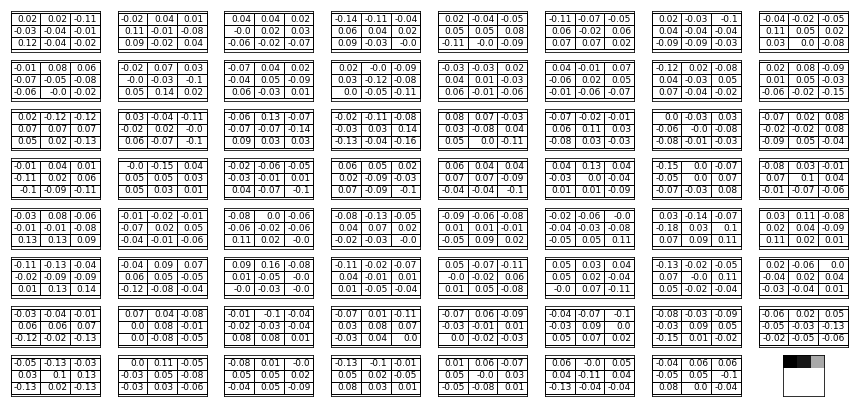

kernel  27 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


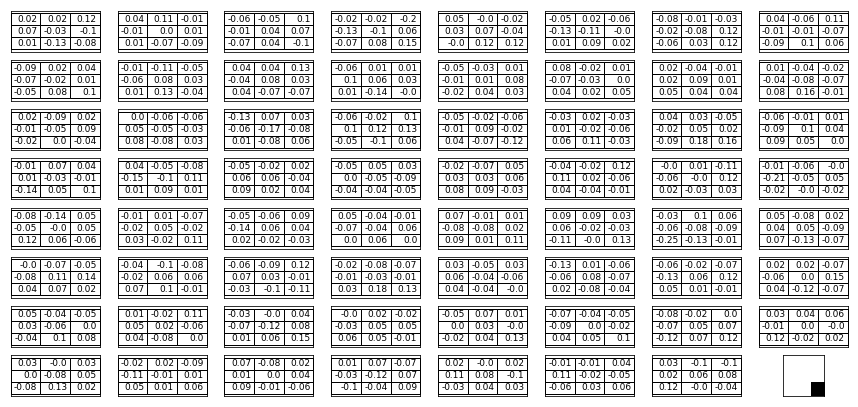

kernel  28 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


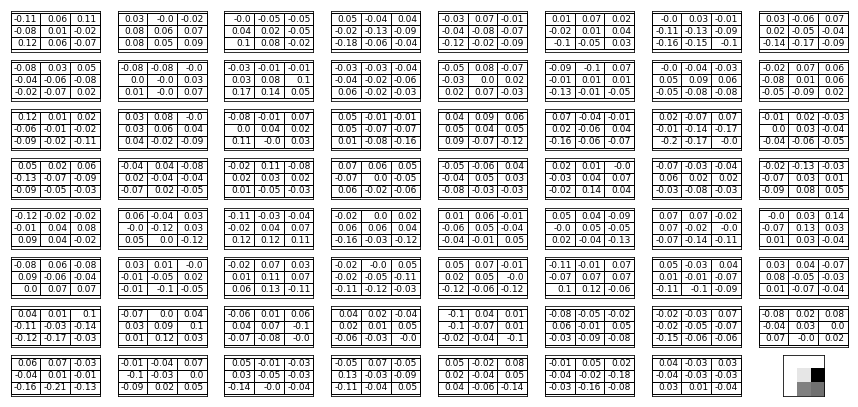

kernel  29 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


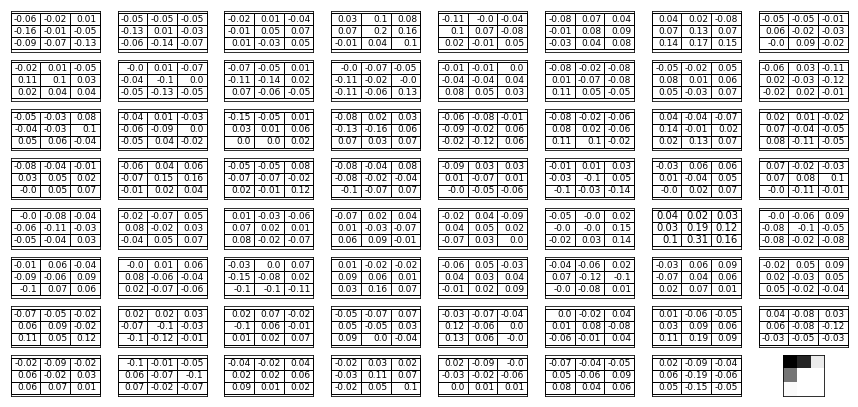

kernel  30 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


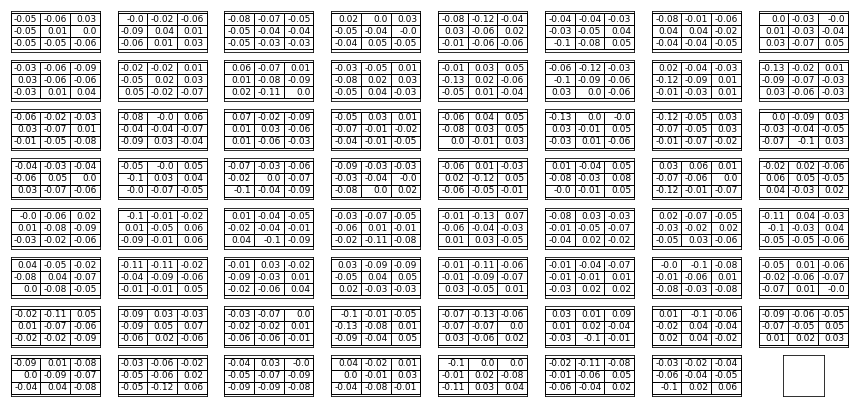

kernel  31 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


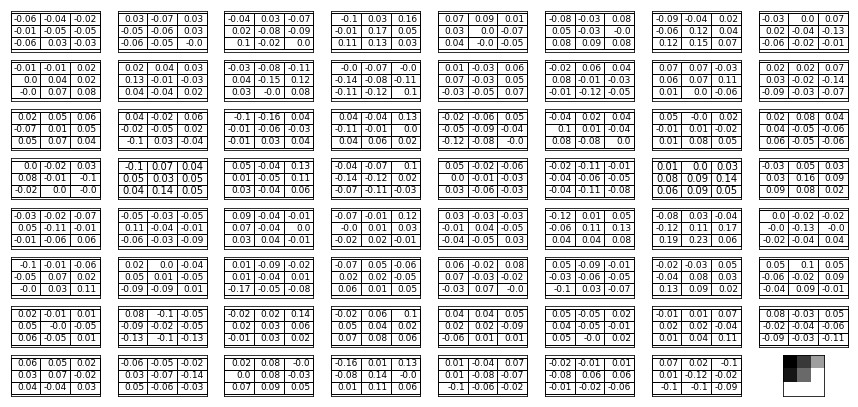

kernel  32 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


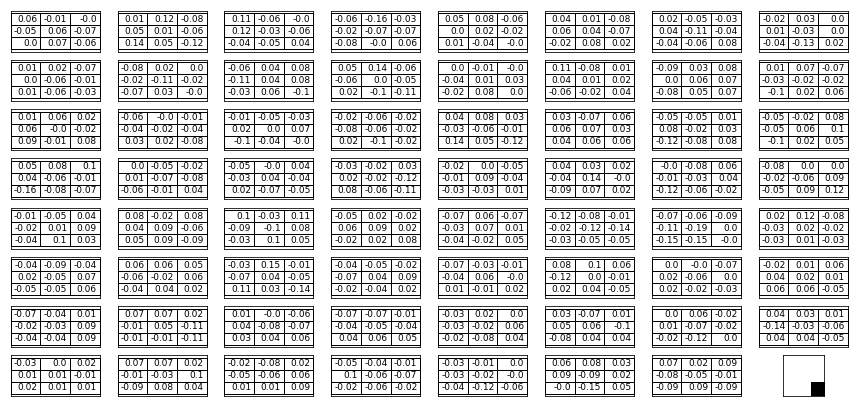

kernel  33 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


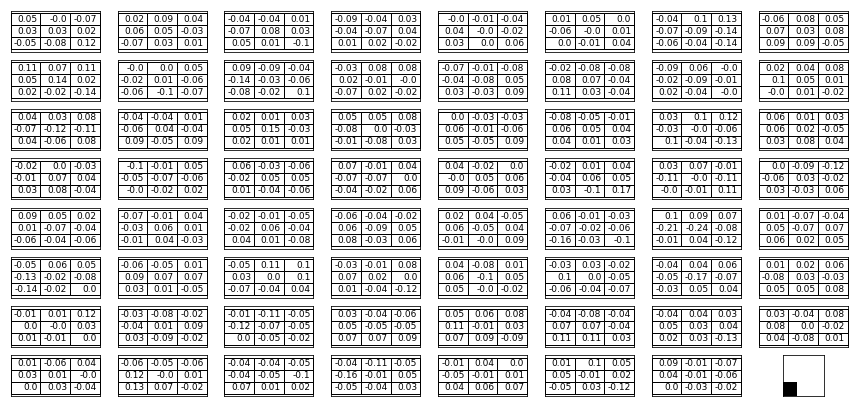

kernel  34 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


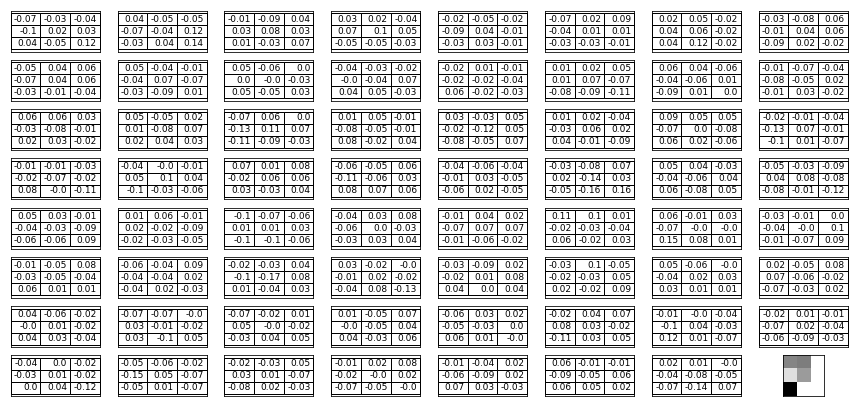

kernel  35 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


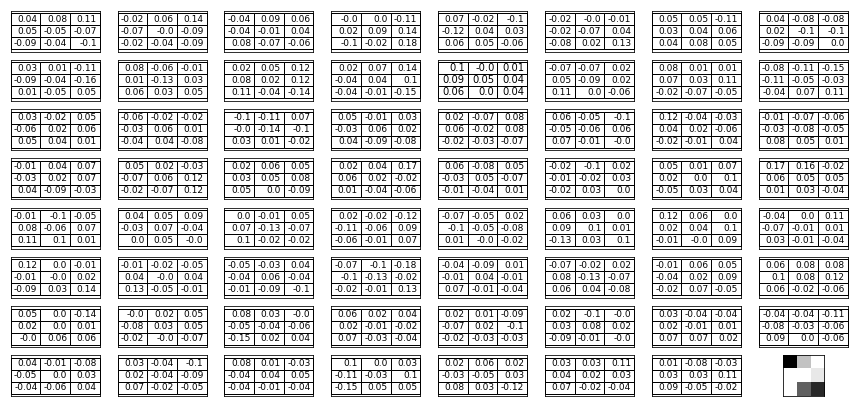

kernel  36 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


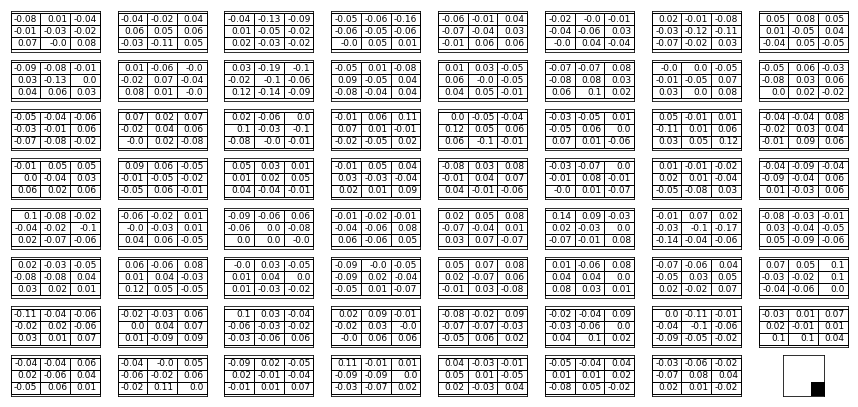

kernel  37 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


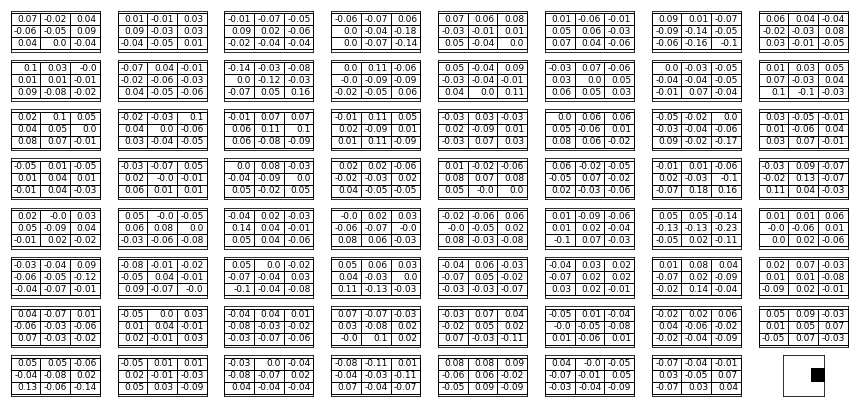

kernel  38 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


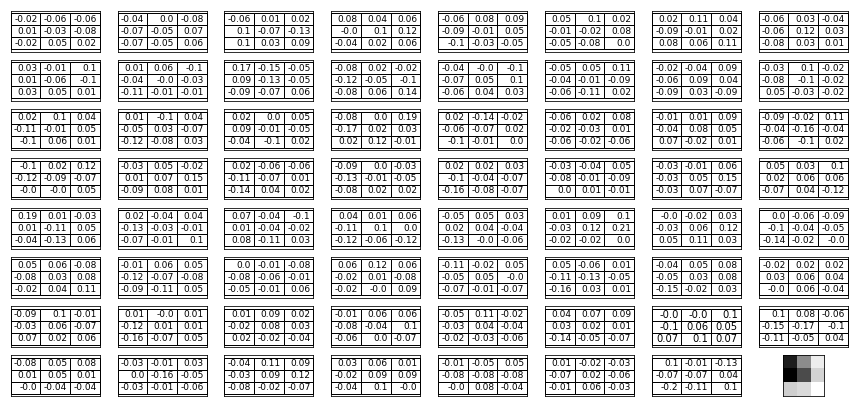

kernel  39 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


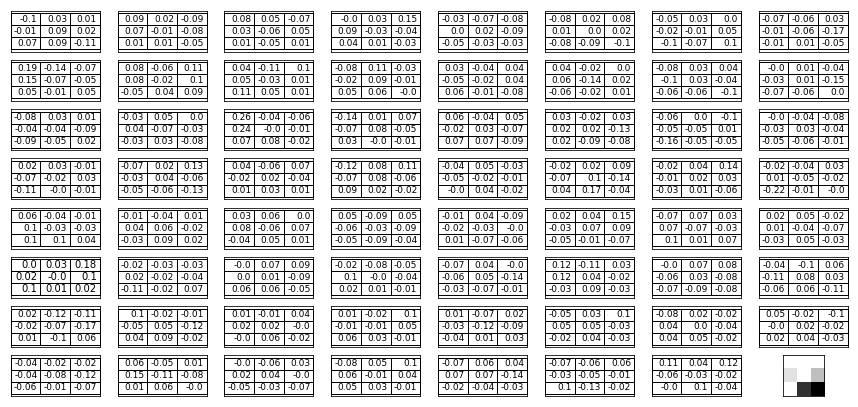

kernel  40 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


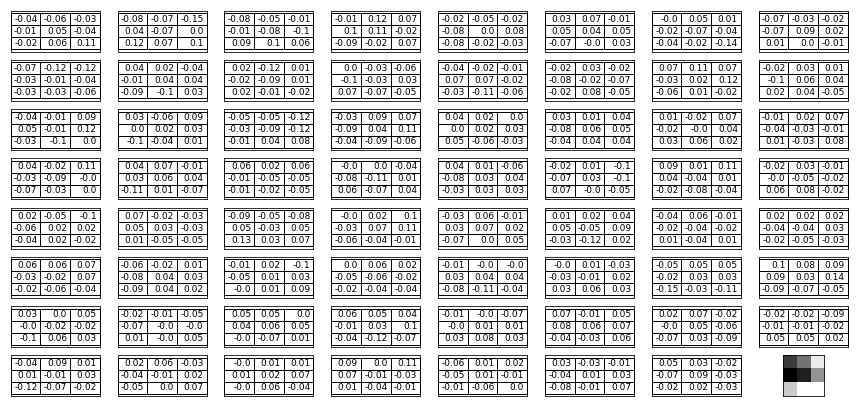

kernel  41 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


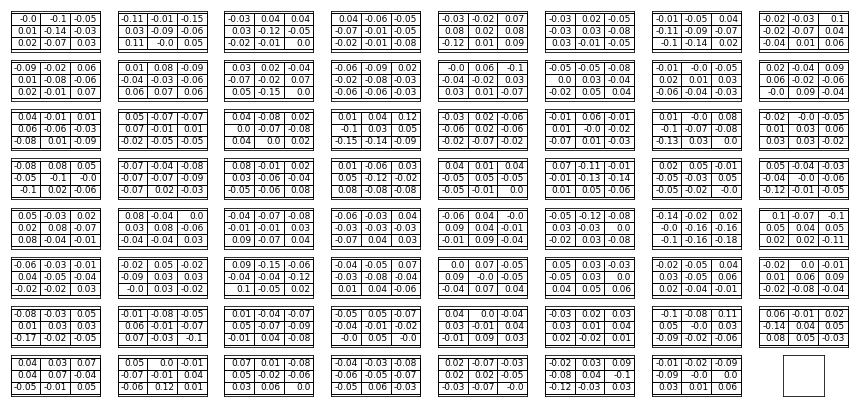

kernel  42 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


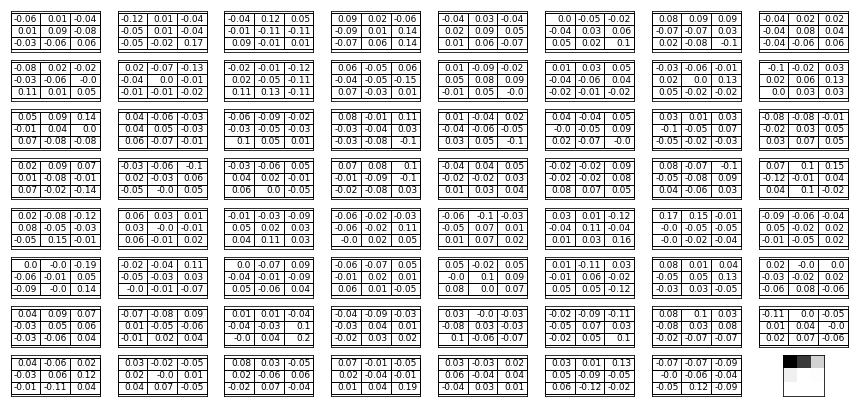

kernel  43 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


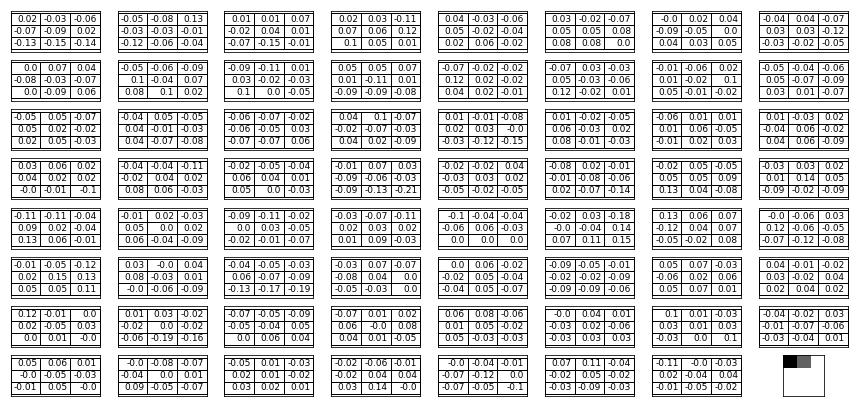

kernel  44 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


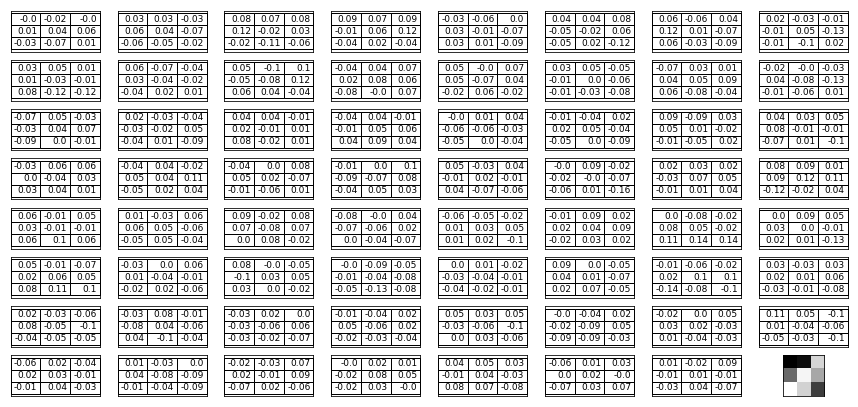

kernel  45 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


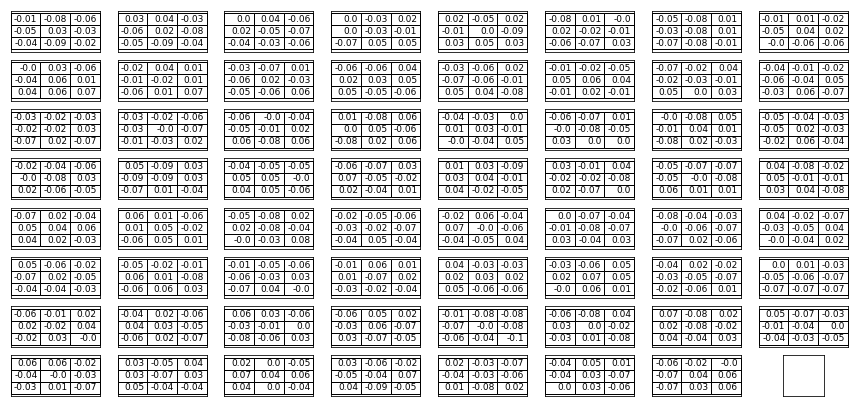

kernel  46 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


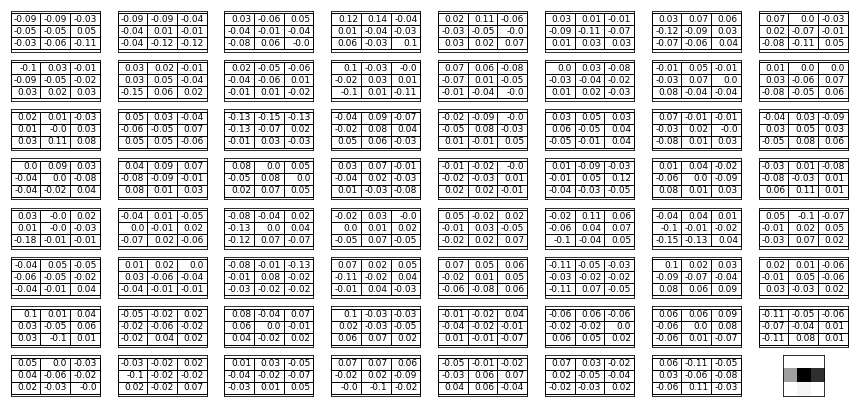

kernel  47 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


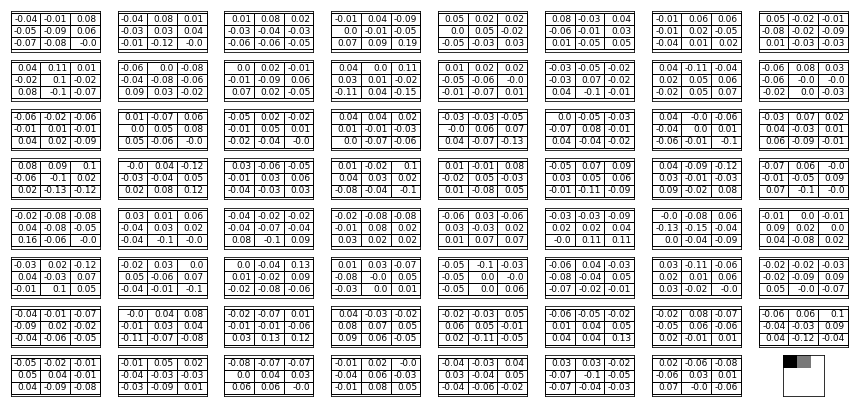

kernel  48 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


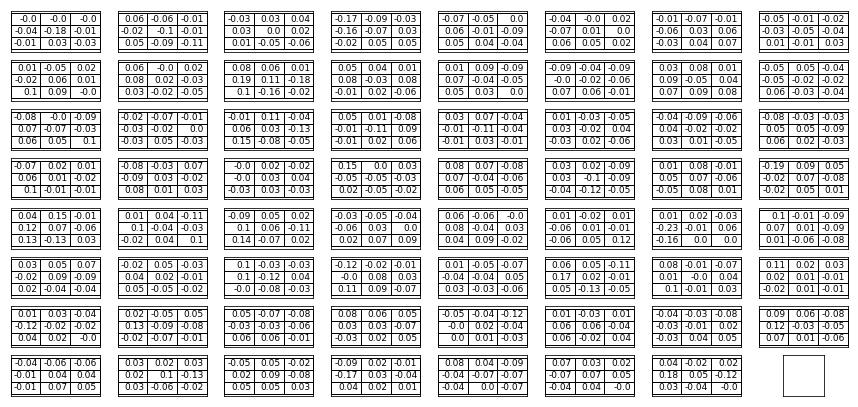

kernel  49 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


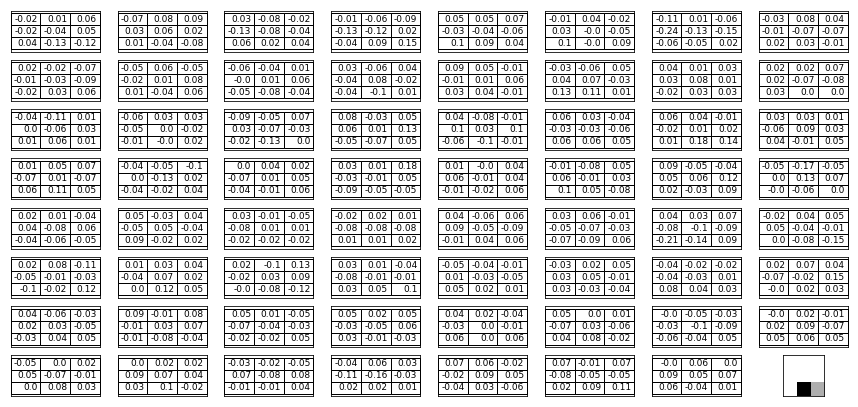

kernel  50 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


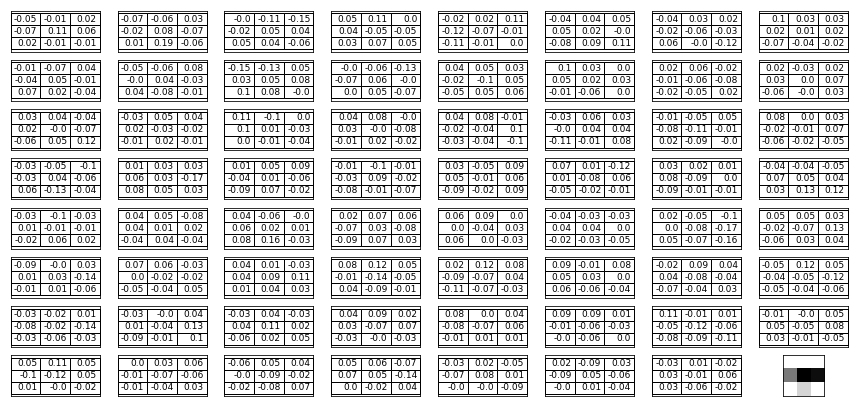

kernel  51 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


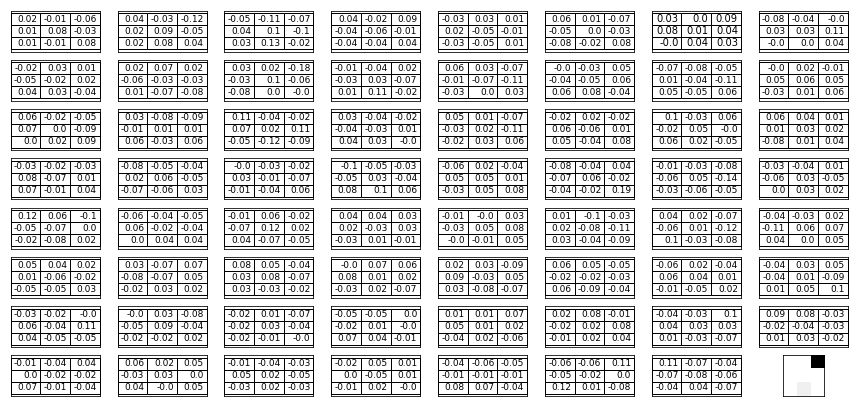

kernel  52 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


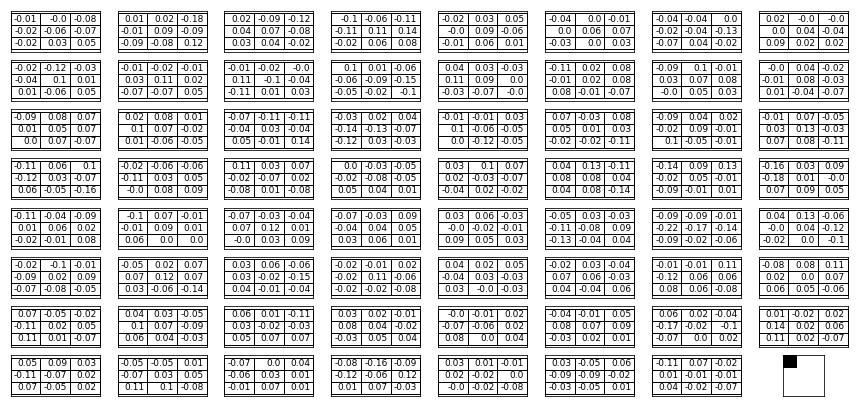

kernel  53 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


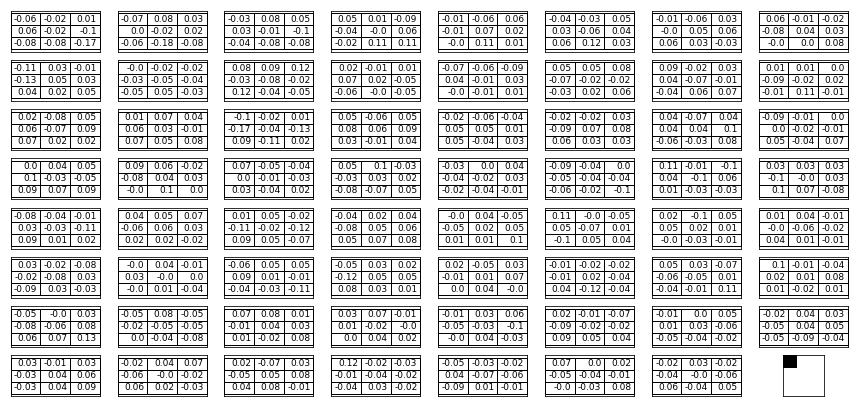

kernel  54 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


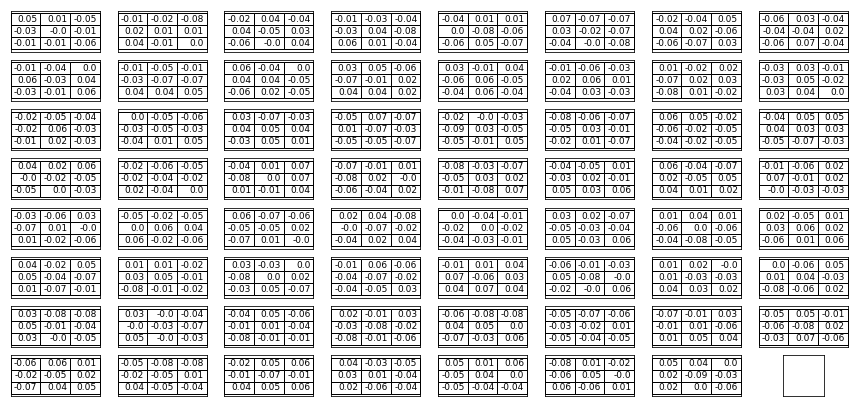

kernel  55 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


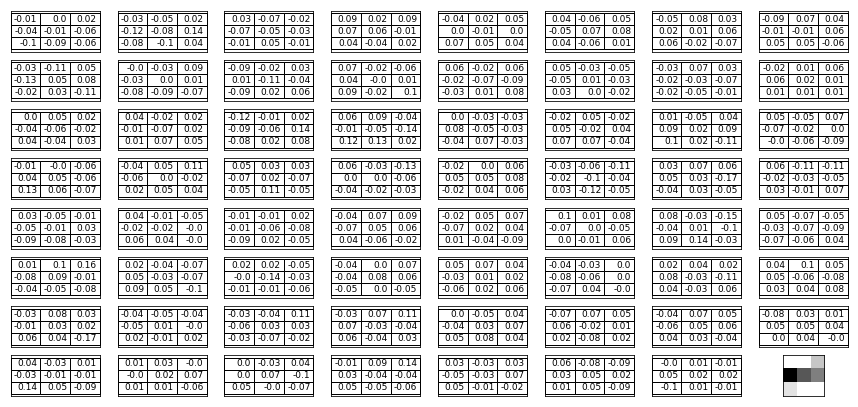

kernel  56 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


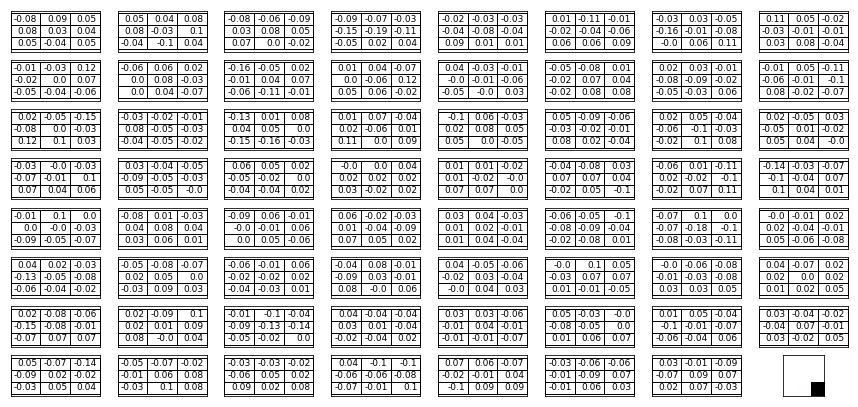

kernel  57 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


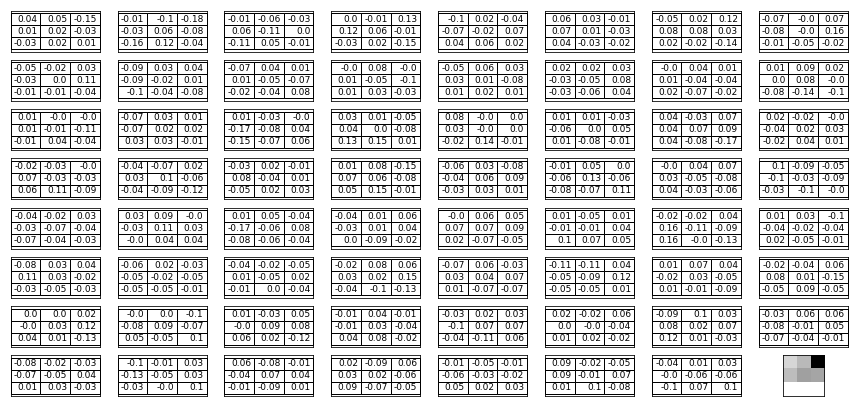

kernel  58 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


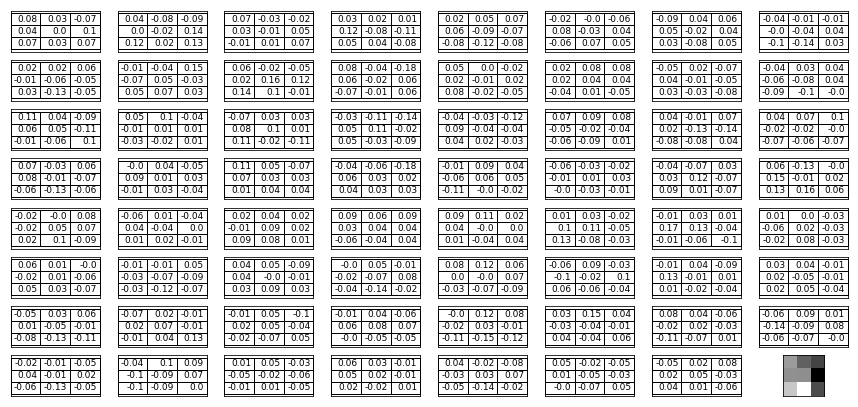

kernel  59 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


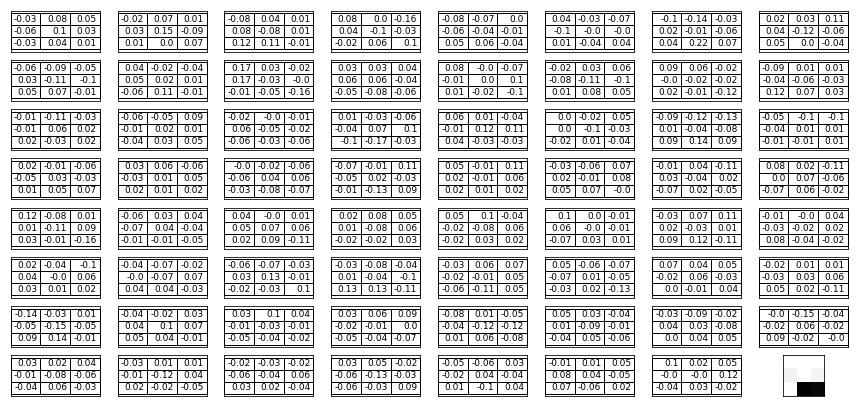

kernel  60 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


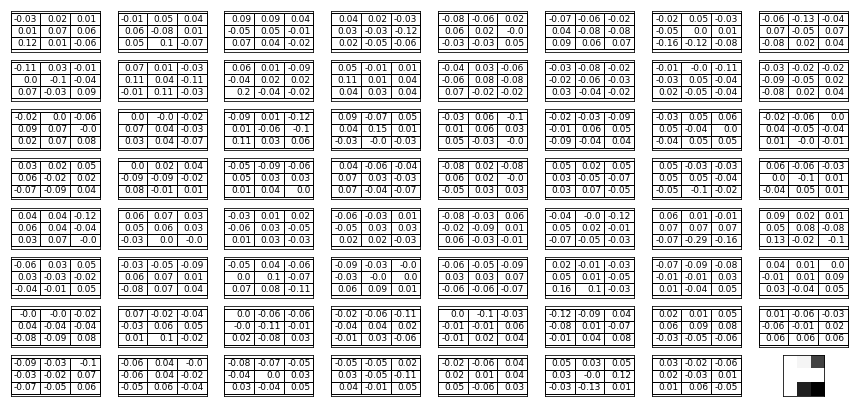

kernel  61 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


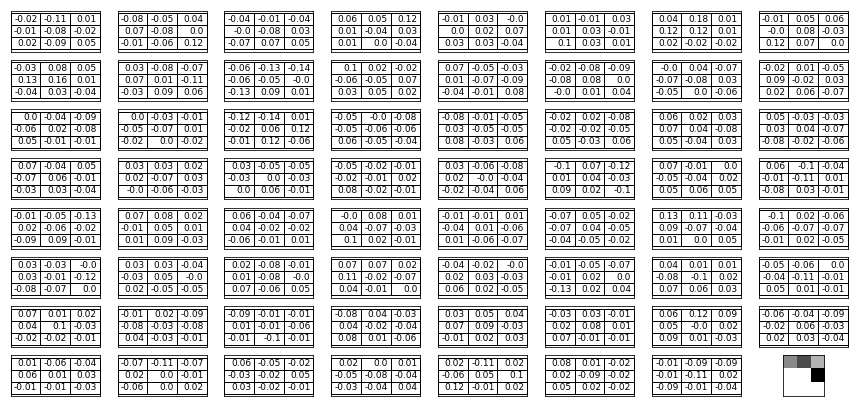

kernel  62 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


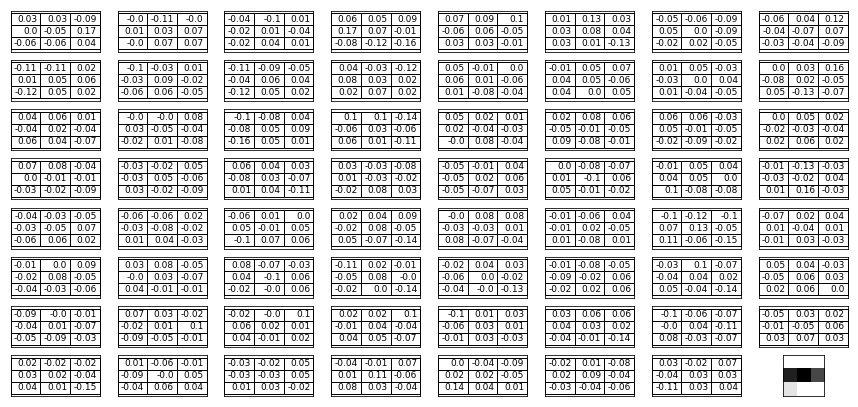

kernel  63 / 64 :  (3, 3, 64)
kernel output:  (1, 3, 3)


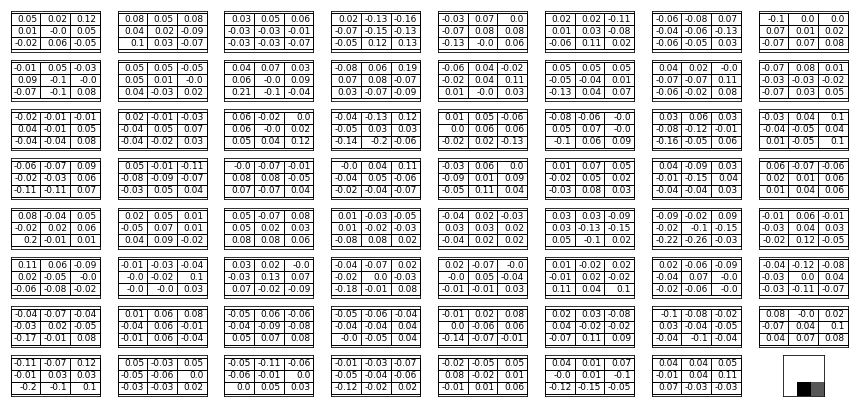

In [6]:
# model.add(layers.Conv2D(64, (3, 3), activation='relu'))
draw_layer(4)

In [7]:
draw_layer(5)
# model.add(layers.Flatten())


layer:  5
input:  Tensor("conv2d_5/Identity:0", shape=(None, 3, 3, 64), dtype=float32)
output:  Tensor("flatten/Identity:0", shape=(None, 576), dtype=float32)
output shape:  (1, 576)


In [55]:
draw_layer(6)
# model.add(layers.Dense(64, activation='relu'))



layer:  6
input:  Tensor("flatten/Identity:0", shape=(None, 576), dtype=float32)
output:  Tensor("dense/Identity:0", shape=(None, 64), dtype=float32)
output shape:  (1, 64)
kernel shape:  (576, 64)
bias:  <tf.Variable 'dense/bias:0' shape=(64,) dtype=float32, numpy=
array([ 0.02197,  0.01833, -0.00739,  0.01137, -0.00216,  0.00371,
        0.00224, -0.01084, -0.01436, -0.00719,  0.01567, -0.0249 ,
        0.03196, -0.01201, -0.01361,  0.01181,  0.0034 ,  0.01596,
       -0.00713,  0.01454,  0.00523,  0.01547, -0.00143, -0.00426,
        0.00638, -0.01196, -0.01976,  0.00884,  0.00782, -0.00673,
        0.03576,  0.01058,  0.01376,  0.02521,  0.01657, -0.00289,
        0.00825,  0.00233,  0.02314, -0.00892, -0.02144,  0.00656,
       -0.00187, -0.00986, -0.0265 ,  0.02266,  0.01593, -0.00885,
        0.01576,  0.00175,  0.0092 ,  0.00083,  0.0065 ,  0.01019,
       -0.01751,  0.01508,  0.01678,  0.00995, -0.0312 , -0.03688,
        0.00225, -0.02557,  0.0118 ,  0.02051], dtype=float32)>

In [56]:
# model.add(layers.Dense(10, activation='softmax'))
draw_layer(7) # same as -1

layer:  7
input:  Tensor("dense/Identity:0", shape=(None, 64), dtype=float32)
output:  Tensor("dense_1/Identity:0", shape=(None, 10), dtype=float32)
output shape:  (1, 10)
kernel shape:  (64, 10)
bias:  <tf.Variable 'dense_1/bias:0' shape=(10,) dtype=float32, numpy=
array([-0.00362,  0.01029, -0.0107 , -0.01939, -0.00346, -0.0211 ,
        0.00097,  0.00685,  0.03365,  0.00072], dtype=float32)>
kernel  0 / 10 :  tf.Tensor(
[ 0.0984  -0.20309 -0.19907  0.10074 -0.01971  0.22577 -0.06189 -0.04964
 -0.29506 -0.02564  0.17173  0.1707  -0.29428  0.00859 -0.12548 -0.04202
 -0.07235  0.14048  0.14476  0.26276 -0.30405  0.25595 -0.07472  0.04487
 -0.06523 -0.13047  0.12959  0.2093  -0.17387  0.09122 -0.08001 -0.07838
 -0.29386 -0.33409  0.20332 -0.23011 -0.04364 -0.03627 -0.17847 -0.29676
 -0.27208 -0.06785  0.12531 -0.01124  0.20364 -0.07795  0.2618  -0.16323
 -0.271   -0.0338   0.02829 -0.08686  0.09336  0.2082   0.00366  0.10565
  0.10708  0.21678 -0.24013  0.18143  0.01835  0.11912 -0.2229